# ```Project Name: ``` Second Sight Through Machine Learning




### ```Project Dataset:``` [IAM Dataset](https://fki.tic.heia-fr.ch/databases/iam-handwriting-database)

### ```Data type: ``` 
- Handwritten text images (in English)

### ```Objectives: ```
##### For this course:
- Proof of Concept of Optical Character Recognization models
- Create a model(s) that can accurately identify handwritten text
- Model should correct for misspelled words

##### Capstone and Beyond:
- Create a text recognization Mobile Application for visually-impaired people
- Identify handwritten, currency, typed text, and computer screen text
- All functions must be performed on device.
- 100% free for download and use

### ```Key Sections: ```

- Section 1. Data Pipeline
- Section 2. Data Exploration Analysis
- Section 3. Data Preprocessing
- Section 4. Baseline Model (CNN + CTC Loss/Decoder)
- Section 5. Enhanced Model (CNN + RNN/LSTM + CTC)
- Section 6. Target Model (CNN + RNN/LSTM + CTC + NLP Spell Check

# Section 1. Data Pipeline

In [39]:
# Import tools and libraries

import os, time
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import numpy as np
import sklearn
import pandas as pd
import string
from collections import Counter

import tensorflow as tf
import tensorflow.keras.backend as K
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
from tensorflow.keras.layers.experimental.preprocessing import StringLookup
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.python.keras.utils.layer_utils import count_params
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import Dense, Reshape, BatchNormalization, Input, Conv2D, MaxPool2D, Lambda, Bidirectional
from tensorflow.compat.v1.keras.layers import CuDNNLSTM
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import *
from tensorflow.keras.utils import to_categorical, Sequence
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from tensorflow.keras import initializers
from keras.callbacks import History

import cv2
import imageio # use imread function to read the image
from PIL import Image
from sklearn.metrics import classification_report

# visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud # visualization

# NLP spell checker
from autocorrect import Speller  

np.random.seed(42)
tf.random.set_seed(42)

### Open the label file (words.txt) and get the lable lines

In [2]:
# Download the IAM dataset to the 'data' folder and open the file
# Labels are stored in words.txt file
#################################################################

words_path = "data"
words_list = []

words = open(f"{words_path}/words.txt", "r").readlines()
for line in words:
    if line[0] == "#":
        continue
    if line.split(" ")[1] != "err":  # remove errored entries
        words_list.append(line)

print("Total label size:", len(words_list))

# print one example of the label line
print(words_list[0])

Total label size: 96456
a01-000u-00-00 ok 154 408 768 27 51 AT A



### Split label line data into training, validation and test

In [3]:
# randomly shuffle the label data
# Use 90% data for training, 5% for validation and 5% for test
####################################################################
np.random.seed(100)
np.random.shuffle(words_list)

split_idx = int(0.9 * len(words_list))
train_samples = words_list[:split_idx]
test_samples = words_list[split_idx:]

val_split_idx = int(0.5 * len(test_samples))
validation_samples = test_samples[:val_split_idx]
test_samples = test_samples[val_split_idx:]

# validate data split is done correctly
assert len(words_list) == len(train_samples) + len(validation_samples) + len(test_samples)

print(f"Total training size: {len(train_samples)}")
print(f"Total validation size: {len(validation_samples)}")
print(f"Total test size: {len(test_samples)}")
print(f"Total data size: {len(words_list)}")
print("\nA sample label line:", train_samples[0])

Total training size: 86810
Total validation size: 4823
Total test size: 4823
Total data size: 96456

A sample label line: j04-039-00-09 ok 172 1967 761 54 66 IN to



### Get text images data

In [4]:
# Handwritten text images are stored under the path (./data/words)
# Define a function to get the image path and image data
#################################################################################

base_image_path = os.path.join(words_path, "words")

def get_image_paths_and_labels(samples):
    paths = []
    corrected_samples = []
    for (i, file_line) in enumerate(samples):
        line_split = file_line.strip()
        line_split = line_split.split(" ")

        # Each line split will have this format for the corresponding image:
        # part1/part1-part2/part1-part2-part3.png
        image_name = line_split[0]
        partI = image_name.split("-")[0]
        partII = image_name.split("-")[1]
        img_path = os.path.join(base_image_path, partI, partI + "-" + partII, image_name + ".png")
        
        #If the file doesn't exist at the path, path.getsize() will raise a FileNotFoundError exception
        if os.path.getsize(img_path):
            paths.append(img_path)
            corrected_samples.append(file_line.split("\n")[0])

    return paths, corrected_samples

### Split image data

In [5]:
# use label lines to get images in the image data folder
# split image and label data into training (90%), validation(5%) and test(5%)
##############################################################################

train_img_paths, train_labels = get_image_paths_and_labels(train_samples)
validation_img_paths, validation_labels = get_image_paths_and_labels(validation_samples)
test_img_paths, test_labels = get_image_paths_and_labels(test_samples)

### Get the ground-truth labels (words) from the lable lines

In [6]:
# From the label lines, we will retrieve the words and the common charactors in the words
#################################################################################

train_labels_cleaned = []
characters = set()
max_len = 0

# Find maximum length and the size of the vocabulary in the training data
# print(train_img_paths[:5])  #print to see the path
# train_labels[:5]  #print to see the labels
for label in train_labels:
    label = label.split(" ")[-1].strip()  #take the last part of each line which is the word
    for char in label:       #take each charactor the word 
        characters.add(char)

    max_len = max(max_len, len(label))
    train_labels_cleaned.append(label)

characters = sorted(list(characters))

print("Longest word: ", max_len)

# Check some label samples.
print("Print some words:", train_labels_cleaned[:30])


Longest word:  21
Print some words: ['to', 'particularly', 'Remember', 'been', 'and', 'by', 'join', 'the', 'the', 'bus', 'was', 'the', 'prehistoric', 'chaos', 'All', "'", 'he', 'shortly', 'their', 'say', 'activity', 'the', 'about', 'did', 'Heather', 'the', 'and', 'Richard', 'Lancaster', 'varies']


In [7]:
# clean the validation and the test labels
#################################################################################

def clean_labels(labels):
    cleaned_labels = []
    for label in labels:
        label = label.split(" ")[-1].strip()
        cleaned_labels.append(label)
    return cleaned_labels

validation_labels_cleaned = clean_labels(validation_labels)
test_labels_cleaned = clean_labels(test_labels)

# Section 2. Data Exploration Analysis

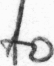

Label: data\words\j04\j04-039\j04-039-00-09.png
Image_1 shape(height, width, channel): (66, 54, 1)
Image_1 data type: <dtype: 'uint8'>


In [8]:
#Using one example to learn about the image and data structure
#################################################################################

display(load_img(train_img_paths[0]))
print("Label:", train_img_paths[0])
img_1_raw = tf.io.read_file(train_img_paths[0])
img_1 = tf.image.decode_image(img_1_raw)
# print(img_1)
print('Image_1 shape(height, width, channel):', img_1.shape)
print('Image_1 data type:', img_1.dtype)
#img_1.shape shows height and weight

In [9]:
# understand the image shape and channel using the imageio imread function
#################################################################################

im = imageio.imread(train_img_paths[0])
print("First imgage's Shape:", im.shape)

#print the first five labels
print("\nFirst five examples", train_labels_cleaned[0:5])

First imgage's Shape: (66, 54)

First five examples ['to', 'particularly', 'Remember', 'been', 'and']


In [10]:
# Print the total number of lablels
#################################################################################

print("Total count of labels is:", (len(words_list)))
# Find out the number of unique labels
unique_labels =set(train_labels_cleaned)
print("The count of unique labels is", len(unique_labels))

Total count of labels is: 96456
The count of unique labels is 11528


#### There are 96,456 labels (text/words) and 11,528 unique text labels in the dataset. We can develop a model to predict by each text image, but it will require a lot more data to build a model that generalizes well

#### Alternatively, we can treat each label as a combination of individual components (characters/symbols), and train a model to identify the underlying components. 

#### Let's find out what the total count of the underlying components (characters/symbols) that are common in our text labels

In [11]:
print("The size of the underlying components (Characters/symbols): ", len(characters))
print("\nPrint the characters/symbols:", characters)

The size of the underlying components (Characters/symbols):  78

Print the characters/symbols: ['!', '"', '#', '&', "'", '(', ')', '*', '+', ',', '-', '.', '/', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', ':', ';', '?', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z', 'a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z']


#### Compared to the 11,528 unque text labels, there are only 78 uniqe letters and symbols underlying all labels. It may be much more efficient to train a model to recognize the letters and symbols that form a text. The model may generalize better as well.

In [12]:
#Indentify the most popular words or symbols
#################################################################################

label_dict = {}
for x in train_labels_cleaned:
    if x in label_dict:        
        label_dict[x] += 1
    else:
        label_dict[x] = 1
sorted_label_dict = {key: value for (key, value) in sorted(label_dict.items(), key=lambda x: x[1], reverse=True)}
most_popular_15 = list(sorted_label_dict.keys())[:15]

# most_popular_15
df_dict = pd.DataFrame(sorted_label_dict.items())
df_dict.columns=['Text', "Count"] 
df_dict['Percent_total'] = df_dict['Count']/df_dict['Count'].sum()*100 
df_dict_top_30 = df_dict[:30]

#### Show the top 30 most popular texts

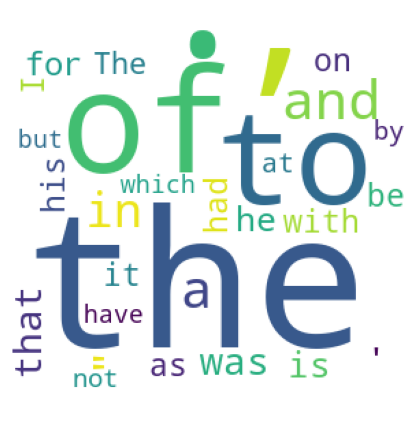

In [13]:
word_could_dict = label_dict
mask = np.array(Image.open("..\\w207_Projects\\note.JFIF"))
wordcloud = WordCloud(width = 1000, height = 500, max_words=30, mask=mask, 
                      background_color='white').generate_from_frequencies(word_could_dict)

plt.figure(figsize=(12,6))
plt.imshow(wordcloud)
# plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)

# store to file
plt.savefig("top_30.png", format="png")
plt.show()

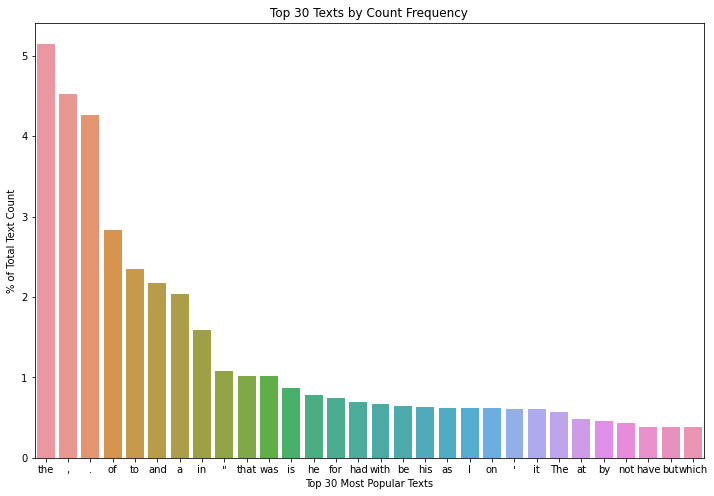

In [14]:
plt.figure(figsize=(12,8))
ax = sns.barplot(x = df_dict_top_30['Text'],
            y = df_dict_top_30['Percent_total'],
            data = df_dict_top_30)
ax.set(xlabel='Top 30 Most Popular Texts', ylabel='% of Total Text Count')
plt.title("Top 30 Texts by Count Frequency")
plt.show()

to
(54, 66)


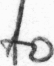

---------------------------
particularly
(339, 108)


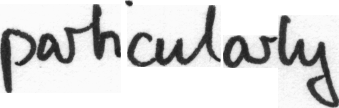

---------------------------
Remember
(358, 118)


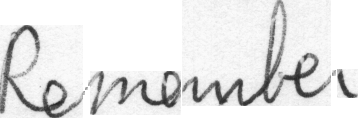

---------------------------
been
(102, 48)


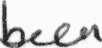

---------------------------
The max width of all images is: 358 
The max height of all images is: 118


In [15]:
#show the first five images
#################################################################################

max_img_width = 0
max_img_height = 0

for i in range(4):
    image = train_img_paths[i]
    label = train_labels_cleaned[i]
    print(label)
    size = load_img(image).size
    if size[0] > max_img_width:
        max_img_width = size[0]
    if size[1] > max_img_height:
        max_img_height = size[1]
    print(size)
    display(load_img(image))
    print("---------------------------")
print("The max width of all images is:", max_img_width, "\nThe max height of all images is:", max_img_height)

# Section 3. Data Preprocessing

### The images in our data set vary in size, let's check out a few examples

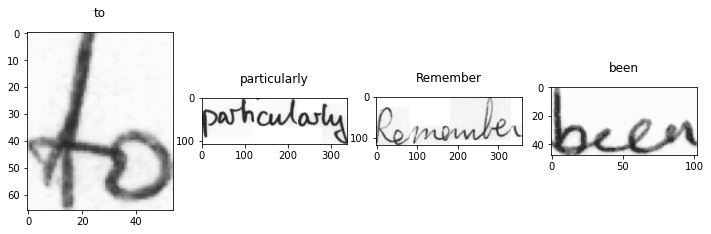

In [16]:
#1 Display the first four images
#################################################################################

def plot_images(image_paths, image_texts, index):
    """
    Display a number of images
    """
    fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(12,10))
    
    for i in range(index):
        image = image_paths[i]
        label = image_texts[i]
        size = load_img(image).size
        label_name = label
        axs[i].imshow(load_img(image))
        axs[i].set_title(label_name, y=1, pad=15)
#         axs[i].axis('off')
    plt.show()    
  
plot_images(train_img_paths, train_labels_cleaned, 4)

###  In order to improve model performance, we will explore image transformation and augmentation

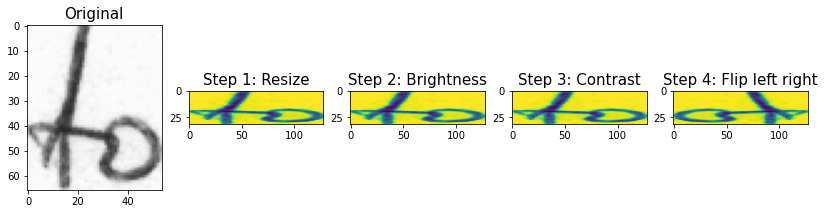

In [17]:
# use one example to explore the image transformation and augmentation techniques
#################################################################################

tf.random.set_seed(1234)

fig = plt.figure(figsize=(14, 12))

# pull first image from data
image = load_img(train_img_paths[0])

# plot original
ax = fig.add_subplot(1, 5, 1)
ax.imshow(image)
ax.set_title('Original', size=15);

#test the image transformation
img_io = tf.io.read_file(train_img_paths[0])

# # 2. Decode and convert to grayscale
img_io = tf.io.decode_png(img_io, channels=1)

# 3. Convert to float32 in [0, 1] range
img_io = tf.image.convert_image_dtype(img_io, tf.float32)

# resize
ax = fig.add_subplot(1, 5, 2)
img_resize = tf.image.resize(img_io, size=(32, 128))
ax.imshow(array_to_img(img_resize))
ax.set_title('Step 1: Resize', size=15);

# adjust brightness
ax = fig.add_subplot(1, 5, 3)
img_bright = tf.image.adjust_brightness(img_resize, 0.3)
ax.imshow(array_to_img(img_bright))
ax.set_title('Step 2: Brightness', size=15);


# adjust contrast
ax = fig.add_subplot(1, 5, 4)
img_contrast = tf.image.adjust_contrast(img_bright, contrast_factor=3)
ax.imshow(array_to_img(img_contrast))
ax.set_title('Step 3: Contrast', size=15);


# flip left right
ax = fig.add_subplot(1, 5, 5)
img_flip = tf.image.flip_left_right(img_contrast)
ax.imshow(array_to_img(img_flip))
ax.set_title('Step 4: Flip left right', size=15);

### Develop the distoration free function to standardize the image size with padding

In [18]:
# Resizing images without distortion

def distortion_free_resize(image, img_size):
    w, h = img_size
    image = tf.image.resize(image, size=(h, w), preserve_aspect_ratio=True)

    # Check tha amount of padding needed to be done.
    pad_height = h - tf.shape(image)[0]
    pad_width = w - tf.shape(image)[1]

    # add the same amount of padding on both sides.
    if pad_height % 2 != 0:
        height = pad_height // 2
        pad_height_top = height + 1
        pad_height_bottom = height
    else:
        pad_height_top = pad_height_bottom = pad_height // 2

    if pad_width % 2 != 0:
        width = pad_width // 2
        pad_width_left = width + 1
        pad_width_right = width
    else:
        pad_width_left = pad_width_right = pad_width // 2

    image = tf.pad(image, paddings=[[pad_height_top, pad_height_bottom],
                                    [pad_width_left, pad_width_right],
                                    [0, 0],],)
    
    # To improve the model accuracy, use the following techniques to 
    # adjust brightness, adjust contrast, transpose and flip the images
    image = tf.image.adjust_brightness(image, 0.3)
    image = tf.image.adjust_contrast(image, contrast_factor=3)
    image = tf.transpose(image, perm=[1, 0, 2])
    image = tf.image.flip_left_right(image)
    return image


In [19]:
# Convert character to integer and convert from integer to charactor
#################################################################################

AUTOTUNE = tf.data.AUTOTUNE

# Mapping characters to integers.
char_to_num = StringLookup(vocabulary=list(characters), mask_token=None)

# Mapping integers back to original characters.
num_to_char = StringLookup(
    vocabulary=char_to_num.get_vocabulary(), mask_token=None, invert=True
)


In [20]:
# Use functions to process the image data and labels
#################################################################################

batch_size = 64
padding_token = 99
image_width = 128
image_height = 32


def preprocess_image(image_path, img_size=(image_width, image_height)):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, 1)
    image = distortion_free_resize(image, img_size)
    image = tf.cast(image, tf.float32) / 255.0
    return image


def vectorize_label(label):
    label = char_to_num(tf.strings.unicode_split(label, input_encoding="UTF-8"))
    length = tf.shape(label)[0]
    pad_amount = max_len - length
    label = tf.pad(label, paddings=[[0, pad_amount]], constant_values=padding_token)
    return label


def process_images_labels(image_path, label):
    image = preprocess_image(image_path)
    label = vectorize_label(label)
    return {"image": image, "label": label}


def prepare_dataset(image_paths, labels):
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, labels)).map(
        process_images_labels, num_parallel_calls=AUTOTUNE
    )
    return dataset.batch(batch_size).cache().prefetch(AUTOTUNE)



In [21]:
# use two examples to process the image data and labels
example_2 = prepare_dataset(train_img_paths[0:2], train_labels_cleaned[0:2])

# show the data shape of the image and confirm the image shape is 128 (height) and 32(width)
# color channel is 1 (grey)
for example in example_2.take(1):
    print(example['image'].shape)
    print(example['label'].shape)    
    

(2, 128, 32, 1)
(2, 21)


In [21]:
# Process the data sets (training, validation and test data)
#################################################################################

train_ds = prepare_dataset(train_img_paths, train_labels_cleaned)
validation_ds = prepare_dataset(validation_img_paths, validation_labels_cleaned)
test_ds = prepare_dataset(test_img_paths, test_labels_cleaned)


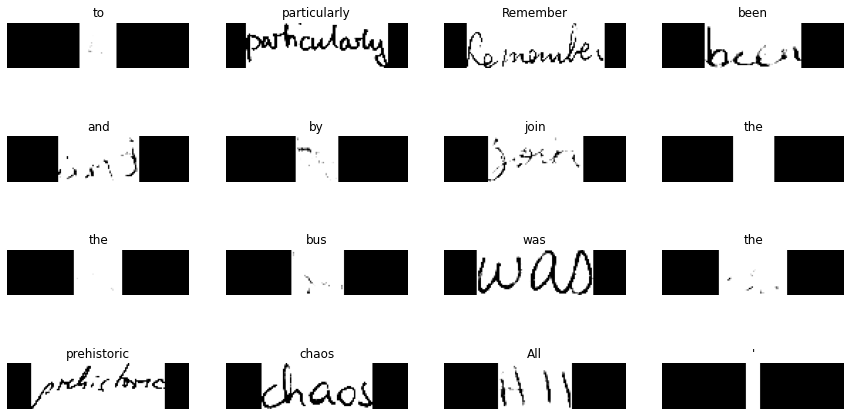

In [22]:
# Visualize a few samples
#################################################################################

for data in train_ds.take(1):
    images, labels = data["image"], data["label"]

    _, ax = plt.subplots(4, 4, figsize=(15, 8))

    for i in range(16):
        img = images[i]
        img = tf.image.adjust_brightness(img, 0.3)
        img = tf.image.adjust_contrast(img, contrast_factor=3)
        img = tf.image.flip_left_right(img)
        img = tf.transpose(img, perm=[1, 0, 2])
        img = (img * 255.0).numpy().clip(0, 255).astype(np.uint8)
        img = img[:, :, 0]

        # Gather indices where label!= padding_token.
        label = labels[i]
        indices = tf.gather(label, tf.where(tf.math.not_equal(label, padding_token)))
        # Convert to string.
        label = tf.strings.reduce_join(num_to_char(indices))
        label = label.numpy().decode("utf-8")

        ax[i // 4, i % 4].imshow(img, cmap="gray")
        ax[i // 4, i % 4].set_title(label)
        ax[i // 4, i % 4].axis("off")


plt.show()

# Section 4. Baseline Model (CNN + CTC Loss/Decoder)

In [98]:
# Use CTC loss/decoder to calculate the loss to train the CNN model and 
# decode the matrix to get the text contained in the input image
#################################################################################

class CTCLayer(keras.layers.Layer):
    def __init__(self, name=None):
        super().__init__(name=name)
        self.loss_fn = keras.backend.ctc_batch_cost

    def call(self, y_true, y_pred):
        batch_len = tf.cast(tf.shape(y_true)[0], dtype="int64")
        input_length = tf.cast(tf.shape(y_pred)[1], dtype="int64")
        label_length = tf.cast(tf.shape(y_true)[1], dtype="int64")

        input_length = input_length * tf.ones(shape=(batch_len, 1), dtype="int64")
        label_length = label_length * tf.ones(shape=(batch_len, 1), dtype="int64")
        loss = self.loss_fn(y_true, y_pred, input_length, label_length)
        self.add_loss(loss)

        # return the predictions
        return y_pred


# Define the Base CNN + CTC Loss Model    
#################################################################################
 
def build_model(kernel_size=(3, 3),
                filter =[32, 64],
                strides=(1, 1),
                pool_size=(2, 2),
                learning_rate=0.001,
                optimizer='Adam',                    
                num_epochs=6):
    
    """ build the model"""
    start_line = f'kernel_size:{kernel_size}\\filter:{filter}\\strides:{strides}\\pool_size:{pool_size}\\Learning_Rate:{learning_rate}\\Optimizer:{optimizer}\\ epochs:{num_epochs}'
    print(f'******************************************')
    print(f'\n\nTrain and Evaluate with: {start_line}')
    tf.keras.backend.clear_session()
    tf.random.set_seed(0)
    
    
    # Inputs to the model
    input_img = keras.Input(shape=(image_width, image_height, 1), name="image")
    labels = keras.layers.Input(name="label", shape=(None,))

    # convolution layers
    x = input_img
    
    for i in range(len(filter)):
        x = keras.layers.Conv2D(filters=filter[i], kernel_size=kernel_size, strides=strides,
                                activation="relu", kernel_initializer="he_normal",
                                padding="same", name="conv"+str(i))(x)
        x = keras.layers.MaxPooling2D(pool_size=pool_size, name="pool"+str(i))(x)


    # Each convolution layer has one max pool with pool size and strides 2.
    # Hence, downsampled feature maps are 4x smaller. The number of
    # filters in the last layer is 64 in the default setting. Reshape accordingly before
    # passing the output to the RNN part of the model.
    
    new_shape = ((image_width // 4), (image_height // 4) * 64)
    x = keras.layers.Reshape(target_shape=new_shape, name="reshape")(x)
    x = keras.layers.Dense(64, activation="relu", name="dense1")(x)
    x = keras.layers.Dropout(0.2)(x)

    # +2 is to account for the two special tokens introduced by the CTC loss.
    x = keras.layers.Dense(len(char_to_num.get_vocabulary()) + 2, activation="softmax", name="dense2")(x)

    # Add CTC layer for calculating CTC loss at each step.
    output = CTCLayer(name="ctc_loss")(labels, x)

    # Define the model.
    model = keras.models.Model(inputs=[input_img, labels], outputs=output, name="OCR")
    
    # Optimizer
    if optimizer=='SGD':
        opt = keras.optimizers.SGD(learning_rate=learning_rate)
    elif optimizer=='Adam':
        opt = keras.optimizers.Adam(learning_rate=learning_rate)
    else:
        raise ValueError('Invalid optimizer: %s' % optimizer)                                       
                                           
    # Compile the model and return.
    model.compile(optimizer=opt)
    
    return model


# Get the model.
model = build_model()
model.summary()

******************************************


Train and Evaluate with: kernel_size:(3, 3)\filter:[32, 64]\strides:(1, 1)\pool_size:(2, 2)\Learning_Rate:0.001\Optimizer:Adam\ epochs:6
Model: "OCR"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 image (InputLayer)             [(None, 128, 32, 1)  0           []                               
                                ]                                                                 
                                                                                                  
 conv0 (Conv2D)                 (None, 128, 32, 32)  320         ['image[0][0]']                  
                                                                                                  
 pool0 (MaxPooling2D)           (None, 64, 16, 32)   0           ['conv0[0][0]']                  
             

## Evaluation metric

#### In this section, we will implement the accuracy metrics by letter and by word and use it as a callback to monitor our model training.  
- Accuracy by letter indicates the prediction accuracy by letter count in each word/text.  
- Accuracy by word indicates the prediction accuracy by word count by matching all letters in each word/text.  
- In general, we expect that the accuracy by letter will be higher than the accuracy by letter

In [24]:
# Segregate the training images and their labels for convenience.
#################################################################################

train_images = []
train_labels = []
train_readable_labels = [train_labels_cleaned[i: i + batch_size] + [None] * 
                              (i + batch_size - len(train_labels_cleaned)) 
                              for i in range(0, len(train_labels_cleaned), batch_size)]

for batch in train_ds:
    train_images.append(batch["image"])
    train_labels.append(batch["label"])

# Segregate the validation images and their labels for convenience.

validation_images = []
validation_labels = []
validation_readable_labels = [validation_labels_cleaned[i: i + batch_size] + [None] * 
                              (i + batch_size - len(validation_labels_cleaned)) 
                              for i in range(0, len(validation_labels_cleaned), batch_size)]

for batch in validation_ds:
    validation_images.append(batch["image"])
    validation_labels.append(batch["label"])



In [25]:
# Decode predictions, define accuracy by letter and word, and create a callback to monitor the accuracies.
#################################################################################
def decode_labels(pred):
    input_len = np.ones(pred.shape[0]) * pred.shape[1]
    # Use greedy search. For complex tasks, you can use beam search.
    results = keras.backend.ctc_decode(pred, input_length=input_len, greedy=True)[0][0][
        :, :max_len
    ]
    # Iterate over the results and get back the text.
    output_text = []
    for res in results:
        res = tf.gather(res, tf.where(tf.math.not_equal(res, -1)))
        res = tf.strings.reduce_join(num_to_char(res)).numpy().decode("utf-8")
        output_text.append(res)
    return output_text

# A utility function to decode the output of the network.
def decode_batch_predictions(pred):
    input_len = np.ones(pred.shape[0]) * pred.shape[1]
    # Use greedy search. For complex tasks, you can use beam search.
    results = keras.backend.ctc_decode(pred, input_length=input_len, greedy=True)[0][0][
        :, :max_len
    ]
    # Iterate over the results and get back the text.
    output_text = []
    for res in results:
        res = tf.gather(res, tf.where(tf.math.not_equal(res, -1)))
        res = tf.strings.reduce_join(num_to_char(res)).numpy().decode("utf-8")
        output_text.append(res)
    return output_text

def accuracy_by_letter(pred, actual):
    max_length = max(len(pred), len(actual))
    min_length = min(len(pred), len(actual))
    letters_correct = 0
    for i in range(min_length):
        if pred[i] == actual[i]:
            letters_correct += 1
    return letters_correct / max_length


def calculate_accuracies(labels, predictions)->tuple:
    acc_letter = []
    acc_word = 0
    preds = decode_batch_predictions(predictions)

    for i in range(len(preds)):
        acc_letter.append(accuracy_by_letter(preds[i], labels[i]))
        if preds[i] == labels[i]:
            acc_word += 1
    return (np.mean(acc_letter),  acc_word / len(labels))

        
class AccuracyCallback(keras.callbacks.Callback):
    def __init__(self, pred_model):
        super().__init__()
        self.prediction_model = pred_model
        self.history = {"acc_letter":[], 
                        "acc_word": [],
                        "val_acc_letter":[], 
                        "val_acc_word": []
                       }

    def on_epoch_end(self, epoch, logs=None):
        letter_accuracies_train = []
        word_accuracies_train = []
        
        letter_accuracies_val = []
        word_accuracies_val = []
        
        for i in range(len(train_images)):
            labels = train_readable_labels[i]
            predictions = self.prediction_model.predict(train_images[i])
            acc_letter, acc_word = calculate_accuracies(labels, predictions)
            letter_accuracies_train.append(acc_letter)
            word_accuracies_train.append(acc_word)

        self.history["acc_letter"].append(np.mean(letter_accuracies_train))
        self.history["acc_word"].append(np.mean(word_accuracies_train))            
        
        for i in range(len(validation_images)):
            labels = validation_readable_labels[i]
            predictions = self.prediction_model.predict(validation_images[i])
            acc_letter, acc_word = calculate_accuracies(labels, predictions)
            letter_accuracies_val.append(acc_letter)
            word_accuracies_val.append(acc_word)

        self.history["val_acc_letter"].append(np.mean(letter_accuracies_val))
        self.history["val_acc_word"].append(np.mean(word_accuracies_val))  
        
        print(
            f"Training Mean accuracy by letter for epoch {epoch + 1}: {np.mean(letter_accuracies_train):.4f}"
        )
        print(
            f"Traing Mean accuracy by word for epoch {epoch + 1}: {np.mean(word_accuracies_train):.4f}"
        )
        print(
            f"Validation Mean accuracy by letter for epoch {epoch + 1}: {np.mean(letter_accuracies_val):.4f}"
        )
        print(
            f"Validation Mean accuracy by word for epoch {epoch + 1}: {np.mean(word_accuracies_val):.4f}"
        )        
        

## Training the Base Model


In [80]:
# train 15 epochs
#################################################################################

epochs = 15 

model_1 = build_model(kernel_size=(3, 3),filter =[32, 64],strides=(1, 1),
                      pool_size=(2, 2), learning_rate=0.001, optimizer='Adam', num_epochs=epochs)

prediction_model_1 = keras.models.Model(model_1.get_layer(name="image").input, model_1.get_layer(name="dense2").output)
accuracy_callback_1 = AccuracyCallback(prediction_model_1)

# Train the model.
history_1 = model_1.fit(train_ds,
                        validation_data=validation_ds,
                        epochs=epochs,
                        callbacks=[accuracy_callback_1],
                        verbose = 2
)

******************************************


Train and Evaluate with: kernel_size:(3, 3)\filter:[32, 64]\strides:(1, 1)\pool_size:(2, 2)\Learning_Rate:0.001\Optimizer:Adam\ epochs:15
Epoch 1/15
2/2 [==============================] - 0s 29ms/step


2/2 [==============================] - 0s 28ms/step


2/2 [==============================] - 0s 28ms/step


2/2 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 38ms/step
Training Mean accuracy by letter for epoch 1: 0.0930
Traing Mean accuracy by word for epoch 1: 0.0776
Validation Mean accuracy by letter for epoch 1: 0.0926
Validation Mean accuracy by word for epoch 1: 0.0763
1357/1357 - 605s - loss: 14.3361 - val_loss: 12.1673 - 605s/epoch - 446ms/step
Epoch 2/15
2/2 [==============================] - 0s 32ms/step


2/2 [==============================] - 0s 33ms/step


2/2 [==============================] - 0s 31ms/step


2/2 [==============================] - 0s 30ms/step


2/2 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 39ms/step
Training Mean accuracy by letter for epoch 2: 0.1854
Traing Mean accuracy by word for epoch 2: 0.1106
Validation Mean accuracy by letter for epoch 2: 0.1885
Validation Mean accuracy by word for epoch 2: 0.1131
1357/1357 - 630s - loss: 11.2888 - val_loss: 10.0836 - 630s/epoch - 464ms/step
Epoch 3/15
2/2 [==============================] - 0s 30ms/step


2/2 [==============================] - 0s 29ms/step


2/2 [==============================] - 0s 30ms/step


2/2 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 46ms/step
Training Mean accuracy by letter for epoch 3: 0.2397
Traing Mean accuracy by word for epoch 3: 0.1400
Validation Mean accuracy by letter for epoch 3: 0.2407
Validation Mean accuracy by word for epoch 3: 0.1417
1357/1357 - 615s - loss: 10.0224 - val_loss: 8.9815 - 615s/epoch - 453ms/step
Epoch 4/15
2/2 [==============================] - 0s 28ms/step


2/2 [==============================] - 0s 28ms/step


2/2 [==============================] - 0s 29ms/step


2/2 [==============================] - 0s 28ms/step


2/2 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 54ms/step
Training Mean accuracy by letter for epoch 4: 0.2923
Traing Mean accuracy by word for epoch 4: 0.1645
Validation Mean accuracy by letter for epoch 4: 0.2947
Validation Mean accuracy by word for epoch 4: 0.1643
1357/1357 - 606s - loss: 9.2457 - val_loss: 8.3990 - 606s/epoch - 446ms/step
Epoch 5/15
2/2 [==============================] - 0s 28ms/step


2/2 [==============================] - 0s 29ms/step


2/2 [==============================] - 0s 29ms/step


2/2 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 53ms/step
Training Mean accuracy by letter for epoch 5: 0.3219
Traing Mean accuracy by word for epoch 5: 0.1805
Validation Mean accuracy by letter for epoch 5: 0.3190
Validation Mean accuracy by word for epoch 5: 0.1760
1357/1357 - 605s - loss: 8.7173 - val_loss: 7.9778 - 605s/epoch - 446ms/step
Epoch 6/15
2/2 [==============================] - 0s 29ms/step


2/2 [==============================] - 0s 31ms/step


2/2 [==============================] - 0s 31ms/step


2/2 [==============================] - 0s 28ms/step


2/2 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 44ms/step
Training Mean accuracy by letter for epoch 6: 0.3302
Traing Mean accuracy by word for epoch 6: 0.1877
Validation Mean accuracy by letter for epoch 6: 0.3318
Validation Mean accuracy by word for epoch 6: 0.1844
1357/1357 - 623s - loss: 8.3685 - val_loss: 7.7112 - 623s/epoch - 459ms/step


Epoch 7/15
2/2 [==============================] - 0s 29ms/step


2/2 [==============================] - 0s 29ms/step


2/2 [==============================] - 0s 27ms/step


2/2 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 51ms/step
Training Mean accuracy by letter for epoch 7: 0.3384
Traing Mean accuracy by word for epoch 7: 0.1946
Validation Mean accuracy by letter for epoch 7: 0.3381
Validation Mean accuracy by word for epoch 7: 0.1941
1357/1357 - 606s - loss: 8.1319 - val_loss: 7.4933 - 606s/epoch - 447ms/step
Epoch 8/15
2/2 [==============================] - 0s 29ms/step


2/2 [==============================] - 0s 29ms/step


2/2 [==============================] - 0s 28ms/step


2/2 [==============================] - 0s 27ms/step


2/2 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 53ms/step
Training Mean accuracy by letter for epoch 8: 0.3433
Traing Mean accuracy by word for epoch 8: 0.1984
Validation Mean accuracy by letter for epoch 8: 0.3440
Validation Mean accuracy by word for epoch 8: 0.1972
1357/1357 - 601s - loss: 7.9507 - val_loss: 7.4197 - 601s/epoch - 443ms/step
Epoch 9/15
2/2 [==============================] - 0s 30ms/step


2/2 [==============================] - 0s 28ms/step


2/2 [==============================] - 0s 28ms/step


2/2 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 37ms/step
Training Mean accuracy by letter for epoch 9: 0.3443
Traing Mean accuracy by word for epoch 9: 0.1998
Validation Mean accuracy by letter for epoch 9: 0.3405
Validation Mean accuracy by word for epoch 9: 0.1959
1357/1357 - 601s - loss: 7.7997 - val_loss: 7.2824 - 601s/epoch - 443ms/step
Epoch 10/15
2/2 [==============================] - 0s 29ms/step


2/2 [==============================] - 0s 30ms/step


2/2 [==============================] - 0s 27ms/step


2/2 [==============================] - 0s 29ms/step


2/2 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 39ms/step
Training Mean accuracy by letter for epoch 10: 0.3445
Traing Mean accuracy by word for epoch 10: 0.2013
Validation Mean accuracy by letter for epoch 10: 0.3443
Validation Mean accuracy by word for epoch 10: 0.1988
1357/1357 - 601s - loss: 7.6831 - val_loss: 7.2206 - 601s/epoch - 443ms/step
Epoch 11/15
2/2 [==============================] - 0s 28ms/step


2/2 [==============================] - 0s 28ms/step


2/2 [==============================] - 0s 27ms/step


2/2 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 47ms/step
Training Mean accuracy by letter for epoch 11: 0.3501
Traing Mean accuracy by word for epoch 11: 0.2066
Validation Mean accuracy by letter for epoch 11: 0.3489
Validation Mean accuracy by word for epoch 11: 0.2029
1357/1357 - 600s - loss: 7.5855 - val_loss: 7.1236 - 600s/epoch - 442ms/step
Epoch 12/15
2/2 [==============================] - 0s 29ms/step


2/2 [==============================] - 0s 29ms/step


2/2 [==============================] - 0s 28ms/step


2/2 [==============================] - 0s 30ms/step


2/2 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 42ms/step
Training Mean accuracy by letter for epoch 12: 0.3486
Traing Mean accuracy by word for epoch 12: 0.2087
Validation Mean accuracy by letter for epoch 12: 0.3446
Validation Mean accuracy by word for epoch 12: 0.2009
1357/1357 - 600s - loss: 7.4940 - val_loss: 7.0792 - 600s/epoch - 442ms/step
Epoch 13/15
2/2 [==============================] - 0s 30ms/step


2/2 [==============================] - 0s 28ms/step


2/2 [==============================] - 0s 30ms/step


2/2 [==============================] - 0s 27ms/step


2/2 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 42ms/step
Training Mean accuracy by letter for epoch 13: 0.3544
Traing Mean accuracy by word for epoch 13: 0.2108
Validation Mean accuracy by letter for epoch 13: 0.3520
Validation Mean accuracy by word for epoch 13: 0.2072
1357/1357 - 598s - loss: 7.4106 - val_loss: 7.0354 - 598s/epoch - 441ms/step
Epoch 14/15
2/2 [==============================] - 0s 29ms/step


2/2 [==============================] - 0s 29ms/step


2/2 [==============================] - 0s 27ms/step


2/2 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 51ms/step
Training Mean accuracy by letter for epoch 14: 0.3568
Traing Mean accuracy by word for epoch 14: 0.2119
Validation Mean accuracy by letter for epoch 14: 0.3547
Validation Mean accuracy by word for epoch 14: 0.2089
1357/1357 - 599s - loss: 7.3380 - val_loss: 6.9589 - 599s/epoch - 441ms/step
Epoch 15/15
2/2 [==============================] - 0s 29ms/step


2/2 [==============================] - 0s 27ms/step


2/2 [==============================] - 0s 28ms/step


2/2 [==============================] - 0s 26ms/step


2/2 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 46ms/step
Training Mean accuracy by letter for epoch 15: 0.3559
Traing Mean accuracy by word for epoch 15: 0.2126
Validation Mean accuracy by letter for epoch 15: 0.3508
Validation Mean accuracy by word for epoch 15: 0.2056
1357/1357 - 599s - loss: 7.2786 - val_loss: 6.9558 - 599s/epoch - 442ms/step


In [82]:
history_1.history

{'loss': [14.336105346679688,
  11.288814544677734,
  10.02235221862793,
  9.245660781860352,
  8.717303276062012,
  8.368496894836426,
  8.131926536560059,
  7.950719356536865,
  7.799746990203857,
  7.683097839355469,
  7.585524082183838,
  7.494034767150879,
  7.410618305206299,
  7.337961196899414,
  7.278632164001465],
 'val_loss': [12.167275428771973,
  10.083606719970703,
  8.981459617614746,
  8.398981094360352,
  7.9778218269348145,
  7.7112274169921875,
  7.493279457092285,
  7.419678688049316,
  7.282388687133789,
  7.220554351806641,
  7.123586654663086,
  7.0792460441589355,
  7.035388469696045,
  6.958890914916992,
  6.95579195022583]}

In [83]:
accuracy_callback_1.history

{'acc_letter': [0.09299036883984149,
  0.18537723122605845,
  0.2397104447854185,
  0.29234696768404556,
  0.32190811994245255,
  0.3302011206670428,
  0.33839588744300203,
  0.3433337356667939,
  0.3442953766274547,
  0.34447662779201255,
  0.3501278917766427,
  0.34860788582322333,
  0.35444237183599425,
  0.3567785701546493,
  0.3558873993321041],
 'acc_word': [0.07756079587324982,
  0.11057249447310243,
  0.14000322402358142,
  0.16452883198231394,
  0.18048774871039056,
  0.18773028739867353,
  0.19459285187914518,
  0.1983695652173913,
  0.19976280397936624,
  0.20127118644067796,
  0.20662536845983787,
  0.20870946941783344,
  0.2108050847457627,
  0.21188743551952838,
  0.21256678334561532],
 'val_acc_letter': [0.09255922681735217,
  0.18850968569731977,
  0.2406555041416627,
  0.2946853745938598,
  0.31899807993306917,
  0.33181497890233425,
  0.3381336967181596,
  0.3440401416410697,
  0.3404657306373698,
  0.34430057651764157,
  0.34888911851768956,
  0.3446412351181733,
  0

In [30]:
# plot functions
#################################################################################

def plot_loss(history):
    plt.plot(history.history['loss'], label='train loss')
    plt.plot(history.history['val_loss'], label='validation loss') # val_loss is the validation/test data
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    
def plot_accuracy_letter(accuracy_callback):
    plt.plot(accuracy_callback.history['acc_letter'], label='Train Accuracy by letter')
    plt.plot(accuracy_callback.history['val_acc_letter'], label='Validation Accuracy by letter') # val_loss is the validation/test data
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy by Letter')
    plt.legend()
#     plt.grid(True)

def plot_accuracy_word(accuracy_callback):
    plt.plot(accuracy_callback.history['acc_word'], label='Train Accuracy by word')
    plt.plot(accuracy_callback.history['val_acc_word'], label='Validation Accuracy by word') # val_loss is the validation/test data
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy by Word')
    plt.legend()
#     plt.grid(True)

def plot_loss_accuracy(history,accuracy_callback):
    hist = history.history
    x_arr = np.arange(len(hist['loss'])) + 1
    
    acc_hist = accuracy_callback.history

    fig = plt.figure(figsize=(15, 4))
    ax = fig.add_subplot(1, 3, 1)
    ax.plot(x_arr, hist['loss'], '-o', label='Train loss')
    ax.plot(x_arr, hist['val_loss'], '--<', label='Validation loss')
    ax.legend(fontsize=10)
    ax.set_xlabel('Epoch', size=10)
    ax.set_ylabel('Loss', size=10)

    ax = fig.add_subplot(1, 3, 2)
    ax.plot(x_arr, acc_hist['acc_letter'], '-o', label='Train acc. by letter')
    ax.plot(x_arr, acc_hist['val_acc_letter'], '--<', label='Validation acc. by letter')
    ax.legend(fontsize=10)
    ax.set_xlabel('Epoch', size=10)
    ax.set_ylabel('Accuracy by Letter', size=10)
    
    ax = fig.add_subplot(1, 3, 3)
    ax.plot(x_arr, acc_hist['acc_word'], '-o', label='Train acc. by word')
    ax.plot(x_arr, acc_hist['val_acc_word'], '--<', label='Validation acc. by word')
    ax.legend(fontsize=10)
    ax.set_xlabel('Epoch', size=10)
    ax.set_ylabel('Accuracy by Word', size=10)
    plt.show()

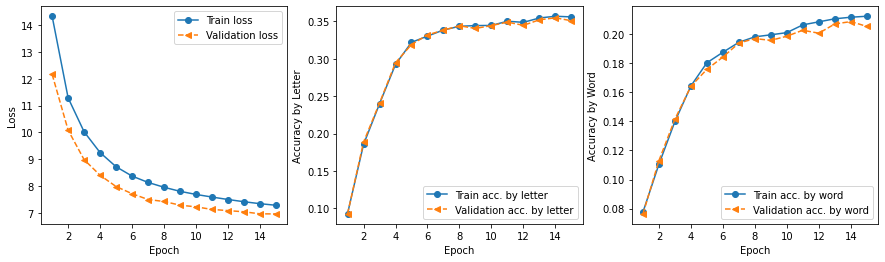

In [90]:
# Base model (CNN + CTC Loss) training results
#################################################################################

plot_loss_accuracy(history_1,accuracy_callback_1)

In [88]:
# Evaluate the model performance for test data
#################################################################################

test_loss_1 = model_1.evaluate(test_ds, verbose=0,
                                 return_dict=True)
print('Test loss:', test_loss_1)
preds_1 = prediction_model_1.predict(test_ds)
calculate_accuracies(test_labels_cleaned, preds_1)

Test loss: {'loss': 7.0568742752075195}
 1/76 [..............................] - ETA: 9s

C:\Users\lisaw\anaconda3\lib\site-packages\keras\engine\functional.py:566: UserWarning: Input dict contained keys ['label'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


76/76 [==============================] - 4s 48ms/step


(0.34118922579942695, 0.19572879950238442)

### Base Model's prediction accuracy results
- Training accuracy by letter: 35.6%
- Traing accuracy by word: 21.3%
- Validation accuracy by letter: 35.1%
- Validation accuracy by word: 20.6%
- Test Accuracy by letter: 34.1%
- Test Accuracy by word: 19.6%


### We experimented changing several parameters (kernel size, optimizer) in the Base Model below, the model results did not beat the above Base Model predictions.

#### Experiment: Test 15 epochs, and change kernel size from (3,3) to (2,2), with other parameters the same

In [81]:
# test 15 epochs, and change kernel size to (2,2), keep all other parameters the same as above
#################################################################################

epochs = 15  

model_2 = build_model(kernel_size=(2, 2),filter =[32, 64],strides=(1, 1),
                      pool_size=(2, 2), learning_rate=0.001, optimizer='Adam', num_epochs=epochs)

prediction_model_2 = keras.models.Model(model_2.get_layer(name="image").input, model_2.get_layer(name="dense2").output)
accuracy_callback_2 = AccuracyCallback(prediction_model_2)

# Train the model.
history_2 = model_2.fit(train_ds,
                        validation_data=validation_ds,
                        epochs=epochs,
                        callbacks=[accuracy_callback_2],
                        verbose = 2
)

******************************************


Train and Evaluate with: kernel_size:(2, 2)\filter:[32, 64]\strides:(1, 1)\pool_size:(2, 2)\Learning_Rate:0.001\Optimizer:Adam\ epochs:15
Epoch 1/15
2/2 [==============================] - 0s 24ms/step


2/2 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 25ms/step


2/2 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 35ms/step
Training Mean accuracy by letter for epoch 1: 0.0658
Traing Mean accuracy by word for epoch 1: 0.0595
Validation Mean accuracy by letter for epoch 1: 0.0681
Validation Mean accuracy by word for epoch 1: 0.0604
1357/1357 - 422s - loss: 14.8649 - val_loss: 12.7631 - 422s/epoch - 311ms/step
Epoch 2/15
2/2 [==============================] - 0s 22ms/step


2/2 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 24ms/step


2/2 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 42ms/step
Training Mean accuracy by letter for epoch 2: 0.0907
Traing Mean accuracy by word for epoch 2: 0.0698
Validation Mean accuracy by letter for epoch 2: 0.0938
Validation Mean accuracy by word for epoch 2: 0.0705
1357/1357 - 418s - loss: 12.4611 - val_loss: 11.6032 - 418s/epoch - 308ms/step
Epoch 3/15
2/2 [==============================] - 0s 22ms/step


2/2 [==============================] - 0s 22ms/step


2/2 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 47ms/step
Training Mean accuracy by letter for epoch 3: 0.1131
Traing Mean accuracy by word for epoch 3: 0.0795
Validation Mean accuracy by letter for epoch 3: 0.1119
Validation Mean accuracy by word for epoch 3: 0.0792
1357/1357 - 418s - loss: 11.6854 - val_loss: 11.0020 - 418s/epoch - 308ms/step
Epoch 4/15
2/2 [==============================] - 0s 24ms/step


2/2 [==============================] - 0s 22ms/step


2/2 [==============================] - 0s 25ms/step


2/2 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 44ms/step
Training Mean accuracy by letter for epoch 4: 0.1554
Traing Mean accuracy by word for epoch 4: 0.0945
Validation Mean accuracy by letter for epoch 4: 0.1576
Validation Mean accuracy by word for epoch 4: 0.0925
1357/1357 - 417s - loss: 11.0856 - val_loss: 10.2669 - 417s/epoch - 307ms/step
Epoch 5/15
2/2 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 21ms/step


2/2 [==============================] - 0s 22ms/step


2/2 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 44ms/step
Training Mean accuracy by letter for epoch 5: 0.1690
Traing Mean accuracy by word for epoch 5: 0.1011
Validation Mean accuracy by letter for epoch 5: 0.1709
Validation Mean accuracy by word for epoch 5: 0.1001
1357/1357 - 416s - loss: 10.6152 - val_loss: 9.8841 - 416s/epoch - 307ms/step
Epoch 6/15
2/2 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 22ms/step


2/2 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 35ms/step
Training Mean accuracy by letter for epoch 6: 0.1913
Traing Mean accuracy by word for epoch 6: 0.1135
Validation Mean accuracy by letter for epoch 6: 0.1926
Validation Mean accuracy by word for epoch 6: 0.1151
1357/1357 - 416s - loss: 10.3081 - val_loss: 9.5816 - 416s/epoch - 307ms/step


Epoch 7/15
2/2 [==============================] - 0s 22ms/step


2/2 [==============================] - 0s 24ms/step


2/2 [==============================] - 0s 24ms/step


2/2 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 43ms/step
Training Mean accuracy by letter for epoch 7: 0.2043
Traing Mean accuracy by word for epoch 7: 0.1194
Validation Mean accuracy by letter for epoch 7: 0.2052
Validation Mean accuracy by word for epoch 7: 0.1184
1357/1357 - 416s - loss: 10.0762 - val_loss: 9.3686 - 416s/epoch - 307ms/step
Epoch 8/15
2/2 [==============================] - 0s 24ms/step


2/2 [==============================] - 0s 24ms/step


2/2 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 22ms/step


2/2 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 40ms/step
Training Mean accuracy by letter for epoch 8: 0.2089
Traing Mean accuracy by word for epoch 8: 0.1219
Validation Mean accuracy by letter for epoch 8: 0.2091
Validation Mean accuracy by word for epoch 8: 0.1207
1357/1357 - 416s - loss: 9.8967 - val_loss: 9.2464 - 416s/epoch - 307ms/step
Epoch 9/15
2/2 [==============================] - 0s 22ms/step


2/2 [==============================] - 0s 22ms/step


2/2 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 43ms/step
Training Mean accuracy by letter for epoch 9: 0.2298
Traing Mean accuracy by word for epoch 9: 0.1282
Validation Mean accuracy by letter for epoch 9: 0.2299
Validation Mean accuracy by word for epoch 9: 0.1262
1357/1357 - 416s - loss: 9.7336 - val_loss: 9.0794 - 416s/epoch - 306ms/step
Epoch 10/15
2/2 [==============================] - 0s 24ms/step


2/2 [==============================] - 0s 22ms/step


2/2 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 22ms/step


2/2 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 40ms/step
Training Mean accuracy by letter for epoch 10: 0.2268
Traing Mean accuracy by word for epoch 10: 0.1296
Validation Mean accuracy by letter for epoch 10: 0.2246
Validation Mean accuracy by word for epoch 10: 0.1256
1357/1357 - 417s - loss: 9.5785 - val_loss: 8.9628 - 417s/epoch - 307ms/step
Epoch 11/15
2/2 [==============================] - 0s 22ms/step


2/2 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 22ms/step


2/2 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 44ms/step
Training Mean accuracy by letter for epoch 11: 0.2330
Traing Mean accuracy by word for epoch 11: 0.1342
Validation Mean accuracy by letter for epoch 11: 0.2334
Validation Mean accuracy by word for epoch 11: 0.1318
1357/1357 - 415s - loss: 9.4338 - val_loss: 8.7972 - 415s/epoch - 306ms/step
Epoch 12/15
2/2 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 22ms/step


2/2 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 43ms/step
Training Mean accuracy by letter for epoch 12: 0.2257
Traing Mean accuracy by word for epoch 12: 0.1300
Validation Mean accuracy by letter for epoch 12: 0.2258
Validation Mean accuracy by word for epoch 12: 0.1275
1357/1357 - 416s - loss: 9.3245 - val_loss: 8.7450 - 416s/epoch - 307ms/step
Epoch 13/15
2/2 [==============================] - 0s 22ms/step


2/2 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 22ms/step


2/2 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 32ms/step
Training Mean accuracy by letter for epoch 13: 0.2335
Traing Mean accuracy by word for epoch 13: 0.1357
Validation Mean accuracy by letter for epoch 13: 0.2296
Validation Mean accuracy by word for epoch 13: 0.1295
1357/1357 - 416s - loss: 9.2343 - val_loss: 8.6590 - 416s/epoch - 306ms/step
Epoch 14/15
2/2 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 22ms/step


2/2 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 42ms/step
Training Mean accuracy by letter for epoch 14: 0.2311
Traing Mean accuracy by word for epoch 14: 0.1350
Validation Mean accuracy by letter for epoch 14: 0.2324
Validation Mean accuracy by word for epoch 14: 0.1351
1357/1357 - 416s - loss: 9.1528 - val_loss: 8.6568 - 416s/epoch - 306ms/step
Epoch 15/15
2/2 [==============================] - 0s 22ms/step


2/2 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 23ms/step


2/2 [==============================] - 0s 25ms/step


2/2 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 32ms/step
Training Mean accuracy by letter for epoch 15: 0.2341
Traing Mean accuracy by word for epoch 15: 0.1303
Validation Mean accuracy by letter for epoch 15: 0.2327
Validation Mean accuracy by word for epoch 15: 0.1246
1357/1357 - 416s - loss: 9.0802 - val_loss: 8.5855 - 416s/epoch - 307ms/step


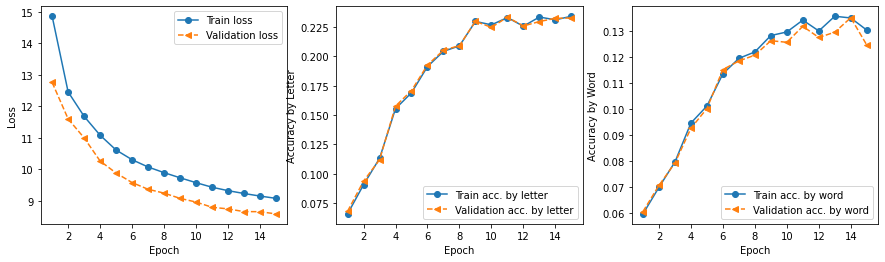

In [86]:
plot_loss_accuracy(history_2,accuracy_callback_2)

In [89]:
# Evaluate the model performance for test data
#################################################################################

test_loss_2 = model_2.evaluate(test_ds, verbose=0,
                                 return_dict=True)
print('Test loss:', test_loss_2)
preds_2 = prediction_model_2.predict(test_ds)
calculate_accuracies(test_labels_cleaned, preds_2)

Test loss: {'loss': 8.750508308410645}
76/76 [==============================] - 3s 39ms/step


(0.22666414177662364, 0.12440389798880365)

### ```Observation```:  Training results with kernel size (2,2) were not better than the initial kernel size (3,3)

#### Experiment: Let's change the optimizer to 'SGD' and see how the training results compare to the prior results

In [28]:
# change to SGD optimizer
epochs = 15 

model_3 = build_model(kernel_size=(3, 3),filter =[32, 64],strides=(1, 1),
                      pool_size=(2, 2), learning_rate=0.001, optimizer='SGD', num_epochs=epochs)

prediction_model_3 = keras.models.Model(model_3.get_layer(name="image").input, model_3.get_layer(name="dense2").output)
accuracy_callback_3 = AccuracyCallback(prediction_model_3)

# Train the model.
history_3 = model_3.fit(train_ds,
                        validation_data=validation_ds,
                        epochs=epochs,
                        callbacks=[accuracy_callback_3],
                        verbose = 2
)

******************************************


Train and Evaluate with: kernel_size:(3, 3)\filter:[32, 64]\strides:(1, 1)\pool_size:(2, 2)\Learning_Rate:0.001\Optimizer:SGD\ epochs:15
Epoch 1/15
2/2 [==============================] - 0s 16ms/step


2/2 [==============================] - 0s 18ms/step


2/2 [==============================] - 0s 17ms/step


2/2 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 29ms/step
Training Mean accuracy by letter for epoch 1: 0.0000
Traing Mean accuracy by word for epoch 1: 0.0000
Validation Mean accuracy by letter for epoch 1: 0.0000
Validation Mean accuracy by word for epoch 1: 0.0000
1357/1357 - 286s - loss: 22.8084 - val_loss: 57.2374 - 286s/epoch - 211ms/step
Epoch 2/15
2/2 [==============================] - 0s 18ms/step


2/2 [==============================] - 0s 18ms/step


2/2 [==============================] - 0s 20ms/step


2/2 [==============================] - 0s 16ms/step


2/2 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 28ms/step
Training Mean accuracy by letter for epoch 2: 0.0000
Traing Mean accuracy by word for epoch 2: 0.0000
Validation Mean accuracy by letter for epoch 2: 0.0000
Validation Mean accuracy by word for epoch 2: 0.0000
1357/1357 - 306s - loss: 20.5133 - val_loss: 57.1953 - 306s/epoch - 226ms/step
Epoch 3/15
2/2 [==============================] - 0s 16ms/step


2/2 [==============================] - 0s 17ms/step


2/2 [==============================] - 0s 16ms/step


2/2 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 37ms/step
Training Mean accuracy by letter for epoch 3: 0.0968
Traing Mean accuracy by word for epoch 3: 0.0739
Validation Mean accuracy by letter for epoch 3: 0.0991
Validation Mean accuracy by word for epoch 3: 0.0740
1357/1357 - 304s - loss: 13.2076 - val_loss: 11.1366 - 304s/epoch - 224ms/step
Epoch 4/15
2/2 [==============================] - 0s 16ms/step


2/2 [==============================] - 0s 16ms/step


2/2 [==============================] - 0s 15ms/step


2/2 [==============================] - 0s 16ms/step


2/2 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 30ms/step
Training Mean accuracy by letter for epoch 4: 0.1976
Traing Mean accuracy by word for epoch 4: 0.1196
Validation Mean accuracy by letter for epoch 4: 0.1963
Validation Mean accuracy by word for epoch 4: 0.1205
1357/1357 - 306s - loss: 10.7465 - val_loss: 9.4812 - 306s/epoch - 226ms/step
Epoch 5/15
2/2 [==============================] - 0s 14ms/step


2/2 [==============================] - 0s 17ms/step


2/2 [==============================] - 0s 16ms/step


2/2 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 28ms/step
Training Mean accuracy by letter for epoch 5: 0.2201
Traing Mean accuracy by word for epoch 5: 0.1326
Validation Mean accuracy by letter for epoch 5: 0.2193
Validation Mean accuracy by word for epoch 5: 0.1324
1357/1357 - 306s - loss: 9.7188 - val_loss: 8.7864 - 306s/epoch - 226ms/step
Epoch 6/15
2/2 [==============================] - 0s 16ms/step


2/2 [==============================] - 0s 17ms/step


2/2 [==============================] - 0s 15ms/step


2/2 [==============================] - 0s 15ms/step


2/2 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 42ms/step
Training Mean accuracy by letter for epoch 6: 0.2574
Traing Mean accuracy by word for epoch 6: 0.1477
Validation Mean accuracy by letter for epoch 6: 0.2574
Validation Mean accuracy by word for epoch 6: 0.1476
1357/1357 - 295s - loss: 9.1740 - val_loss: 8.3418 - 295s/epoch - 217ms/step


Epoch 7/15
2/2 [==============================] - 0s 16ms/step


2/2 [==============================] - 0s 17ms/step


2/2 [==============================] - 0s 16ms/step


2/2 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 29ms/step
Training Mean accuracy by letter for epoch 7: 0.2621
Traing Mean accuracy by word for epoch 7: 0.1523
Validation Mean accuracy by letter for epoch 7: 0.2592
Validation Mean accuracy by word for epoch 7: 0.1530
1357/1357 - 308s - loss: 8.8429 - val_loss: 8.1610 - 308s/epoch - 227ms/step
Epoch 8/15
2/2 [==============================] - 0s 16ms/step


2/2 [==============================] - 0s 17ms/step


2/2 [==============================] - 0s 17ms/step


2/2 [==============================] - 0s 17ms/step


2/2 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 30ms/step
Training Mean accuracy by letter for epoch 8: 0.2355
Traing Mean accuracy by word for epoch 8: 0.1403
Validation Mean accuracy by letter for epoch 8: 0.2370
Validation Mean accuracy by word for epoch 8: 0.1417
1357/1357 - 307s - loss: 8.6171 - val_loss: 8.4515 - 307s/epoch - 226ms/step
Epoch 9/15
2/2 [==============================] - 0s 16ms/step


2/2 [==============================] - 0s 19ms/step


2/2 [==============================] - 0s 17ms/step


2/2 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 27ms/step
Training Mean accuracy by letter for epoch 9: 0.2980
Traing Mean accuracy by word for epoch 9: 0.1766
Validation Mean accuracy by letter for epoch 9: 0.2947
Validation Mean accuracy by word for epoch 9: 0.1727
1357/1357 - 307s - loss: 8.4531 - val_loss: 7.7407 - 307s/epoch - 226ms/step
Epoch 10/15
2/2 [==============================] - 0s 15ms/step


2/2 [==============================] - 0s 16ms/step


2/2 [==============================] - 0s 16ms/step


2/2 [==============================] - 0s 16ms/step


2/2 [==============================] - 0s 15ms/step


1/1 [==============================] - 0s 27ms/step
Training Mean accuracy by letter for epoch 10: 0.2932
Traing Mean accuracy by word for epoch 10: 0.1733
Validation Mean accuracy by letter for epoch 10: 0.2898
Validation Mean accuracy by word for epoch 10: 0.1706
1357/1357 - 308s - loss: 8.3141 - val_loss: 7.7157 - 308s/epoch - 227ms/step
Epoch 11/15
2/2 [==============================] - 0s 15ms/step


2/2 [==============================] - 0s 15ms/step


2/2 [==============================] - 0s 15ms/step


2/2 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 30ms/step
Training Mean accuracy by letter for epoch 11: 0.2919
Traing Mean accuracy by word for epoch 11: 0.1781
Validation Mean accuracy by letter for epoch 11: 0.2858
Validation Mean accuracy by word for epoch 11: 0.1731
1357/1357 - 306s - loss: 8.2157 - val_loss: 7.6104 - 306s/epoch - 225ms/step
Epoch 12/15
2/2 [==============================] - 0s 15ms/step


2/2 [==============================] - 0s 16ms/step


2/2 [==============================] - 0s 17ms/step


2/2 [==============================] - 0s 16ms/step


2/2 [==============================] - 0s 18ms/step


1/1 [==============================] - 0s 27ms/step
Training Mean accuracy by letter for epoch 12: 0.3130
Traing Mean accuracy by word for epoch 12: 0.1833
Validation Mean accuracy by letter for epoch 12: 0.3088
Validation Mean accuracy by word for epoch 12: 0.1807
1357/1357 - 306s - loss: 8.1222 - val_loss: 7.5958 - 306s/epoch - 225ms/step
Epoch 13/15
2/2 [==============================] - 0s 14ms/step


2/2 [==============================] - 0s 17ms/step


2/2 [==============================] - 0s 16ms/step


2/2 [==============================] - 0s 17ms/step


2/2 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 29ms/step
Training Mean accuracy by letter for epoch 13: 0.2985
Traing Mean accuracy by word for epoch 13: 0.1799
Validation Mean accuracy by letter for epoch 13: 0.2936
Validation Mean accuracy by word for epoch 13: 0.1762
1357/1357 - 306s - loss: 8.0435 - val_loss: 7.4699 - 306s/epoch - 225ms/step
Epoch 14/15
2/2 [==============================] - 0s 15ms/step


2/2 [==============================] - 0s 15ms/step


2/2 [==============================] - 0s 15ms/step


2/2 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 27ms/step
Training Mean accuracy by letter for epoch 14: 0.3047
Traing Mean accuracy by word for epoch 14: 0.1840
Validation Mean accuracy by letter for epoch 14: 0.3022
Validation Mean accuracy by word for epoch 14: 0.1813
1357/1357 - 301s - loss: 7.9566 - val_loss: 7.4698 - 301s/epoch - 222ms/step
Epoch 15/15
2/2 [==============================] - 0s 15ms/step


2/2 [==============================] - 0s 15ms/step


2/2 [==============================] - 0s 15ms/step


2/2 [==============================] - 0s 15ms/step


2/2 [==============================] - 0s 16ms/step


1/1 [==============================] - 0s 29ms/step
Training Mean accuracy by letter for epoch 15: 0.3315
Traing Mean accuracy by word for epoch 15: 0.1965
Validation Mean accuracy by letter for epoch 15: 0.3249
Validation Mean accuracy by word for epoch 15: 0.1918
1357/1357 - 304s - loss: 7.9054 - val_loss: 7.3132 - 304s/epoch - 224ms/step


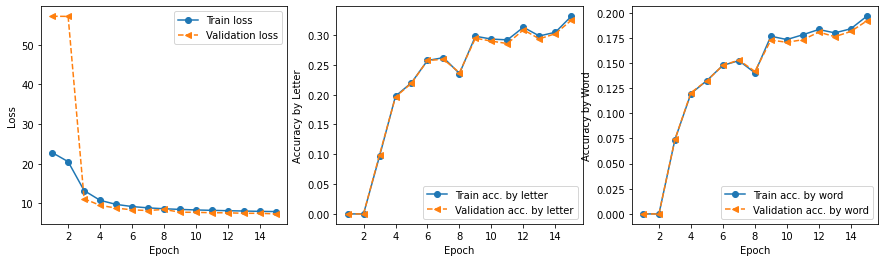

In [31]:
plot_loss_accuracy(history_3,accuracy_callback_3)

In [32]:
# Evaluate the model performance for test data
#################################################################################

test_loss_3 = model_3.evaluate(test_ds, verbose=0,
                                 return_dict=True)
print('Test loss:', test_loss_3)
preds_3 = prediction_model_3.predict(test_ds)
calculate_accuracies(test_labels_cleaned, preds_3)

Test loss: {'loss': 7.436303615570068}
 3/76 [>.............................] - ETA: 1s

C:\Users\lisaw\anaconda3\lib\site-packages\keras\engine\functional.py:566: UserWarning: Input dict contained keys ['label'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


76/76 [==============================] - 2s 26ms/step


(0.32215867592448555, 0.18660584698320548)

### ```Observation```:  Training results with SGD Optimizer were not better than Adam Optimizer

### Conclusion on the Base Model:  
- We experimented changing the parameters (e.g. Kernel, Optimzer) using 15 trainng epochs and found the following settings for CNN generate the best Base Model results 

  kernel_size=(3, 3),filter =[32, 64],strides=(1, 1), pool_size=(2, 2), learning_rate=0.001, optimizer='Adam'


- Base Model Results for 15 training epochs:
    - Training accuracy by letter: 35.6%
    - Traing accuracy by word: 21.3%
    - Validation accuracy by letter: 35.1%
    - Validation accuracy by word: 20.6%
    - Test Accuracy by letter: 34.1%
    - Test Accuracy by word: 19.6%


#### We could increase epochs and refine parameters further to improve the above results, but the improvement will slow down and may not get higher than 50% accuracy (by letter/charaters).  We believe that CNN model is not sufficient to capture the complex features of this data set.  Next we will add RNN model layers to see whether that will enhance the model perperformance

# Section 5. Enhanced Model (CNN + RNN/LSTM + CTC)

In [26]:
# Add RNN/LSTM models

def build_model_enhanced(kernel_size=(3, 3),
                         filter =[32, 64],
                         strides=(1, 1),
                         pool_size=(2, 2),
                         learning_rate=0.001,
                         optimizer='Adam', 
                         hidden_layer_sizes=[200, 128, 64],
                         dropout=0.20,
                         num_epochs=15):
    
    """ build the model"""
    start_line = f'kernel_size:{kernel_size}\\filter:{filter}\\strides:{strides}\\pool_size:{pool_size}\\Learning_Rate:{learning_rate}\\Optimizer:{optimizer}\\ epochs:{num_epochs}'
    print(f'******************************************')
    print(f'\n\nTrain Model with: {start_line}')
    tf.keras.backend.clear_session()
    tf.random.set_seed(0)
        
    # Inputs to the model
    input_img = keras.Input(shape=(image_width, image_height, 1), name="image")
    labels = keras.layers.Input(name="label", shape=(None,))

    # convolution layers
    x = input_img
    
    for i in range(len(filter)):
        x = keras.layers.Conv2D(filters=filter[i], kernel_size=kernel_size, strides=strides,
                                activation="relu", kernel_initializer="he_normal",
                                padding="same", name="conv"+str(i))(x)
        x = keras.layers.MaxPooling2D(pool_size=pool_size, name="pool"+str(i))(x)

    # We have used two max pool with pool size and strides 2.
    # Hence, downsampled feature maps are 4x smaller. The number of
    # filters in the last layer is 64 (in our default value). Reshape accordingly before
    # passing the output to the RNN part of the model.
    new_shape = ((image_width // 4), (image_height // 4) * 64)
    x = keras.layers.Reshape(target_shape=new_shape, name="reshape")(x)
    x = keras.layers.Dense(64, activation="relu", name="dense1")(x)
    
    # add dropout rate
    x = keras.layers.Dropout(dropout)(x)

    # RNNs.
    # add layers based on hidden_layer_sizes
    inputs_layer = x
    for i in range(len(hidden_layer_sizes)):
        input = keras.layers.Bidirectional(keras.layers.LSTM(hidden_layer_sizes[i], 
                                                             return_sequences=True, 
                                                             dropout=dropout))(inputs_layer)
        inputs_layer = input                                     
        
    x = inputs_layer

    # +2 is to account for the two special tokens introduced by the CTC loss.
    # The recommendation comes here: https://git.io/J0eXP.
    x = keras.layers.Dense(len(char_to_num.get_vocabulary()) + 2, activation="softmax", name="dense2")(x)

    # Add CTC layer for calculating CTC loss at each step.
    output = CTCLayer(name="ctc_loss")(labels, x)

    # Define the model.
    model = keras.models.Model(inputs=[input_img, labels], outputs=output, name="OCR")
    
    # Optimizer
    if optimizer=='SGD':
        opt = keras.optimizers.SGD(learning_rate=learning_rate)
    elif optimizer=='Adam':
        opt = keras.optimizers.Adam(learning_rate=learning_rate)
    else:
        raise ValueError('Invalid optimizer: %s' % optimizer)                                       
                                           
    # Compile the model and return.
    model.compile(optimizer=opt)
    
    return model


# Get the model.
model_enhanced = build_model_enhanced()
model_enhanced.summary()

******************************************


Train Model with: kernel_size:(3, 3)\filter:[32, 64]\strides:(1, 1)\pool_size:(2, 2)\Learning_Rate:0.001\Optimizer:Adam\ epochs:15
Model: "OCR"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 image (InputLayer)             [(None, 128, 32, 1)  0           []                               
                                ]                                                                 
                                                                                                  
 conv0 (Conv2D)                 (None, 128, 32, 32)  320         ['image[0][0]']                  
                                                                                                  
 pool0 (MaxPooling2D)           (None, 64, 16, 32)   0           ['conv0[0][0]']                  
                   

#### Initial Run: Use kernel size (3,3) and RNN layers [128, 64], keeping the other parameters the same as the Base Model

In [99]:
epochs = 15 

model_e4 = build_model_enhanced(kernel_size=(3, 3),
                               filter =[32, 64],
                               strides=(1, 1),
                               pool_size=(2, 2), 
                               learning_rate=0.001, 
                               hidden_layer_sizes=[128, 64],
                               dropout=0.20,
                               optimizer='Adam', 
                               num_epochs=epochs)

prediction_model_e4 = keras.models.Model(model_e4.get_layer(name="image").input, model_e4.get_layer(name="dense2").output)
accuracy_callback_e4 = AccuracyCallback(prediction_model_e4)

# Train the model.
history_e4 = model_e4.fit(train_ds,
                        validation_data=validation_ds,
                        epochs=epochs,
                        callbacks=[accuracy_callback_e4],
#                         verbose = 2
)

******************************************


Train Model with: kernel_size:(3, 3)\filter:[32, 64]\strides:(1, 1)\pool_size:(2, 2)\Learning_Rate:0.001\Optimizer:Adam\ epochs:15
Epoch 1/15
2/2 [==============================] - 0s 126ms/step


2/2 [==============================] - 0s 117ms/step


2/2 [==============================] - 0s 101ms/step


2/2 [==============================] - 0s 94ms/step


2/2 [==============================] - 0s 85ms/step


2/2 [==============================] - 0s 81ms/step


2/2 [==============================] - 0s 78ms/step


2/2 [==============================] - 0s 76ms/step


2/2 [==============================] - 0s 78ms/step


1/1 [==============================] - 0s 74ms/step
Training Mean accuracy by letter for epoch 1: 0.2833
Traing Mean accuracy by word for epoch 1: 0.1814
Validation Mean accuracy by letter for epoch 1: 0.2854
Validation Mean accuracy by word for epoch 1: 0.1834
1357/1357 [==============================] - 1761s 1s/step - loss: 13.0652 - val_loss: 10.5975
Epoch 2/15
2/2 [==============================] - 0s 78ms/step


2/2 [==============================] - 0s 76ms/step


2/2 [==============================] - 0s 76ms/step


2/2 [==============================] - 0s 75ms/step


2/2 [==============================] - 0s 75ms/step


2/2 [==============================] - 0s 71ms/step


2/2 [==============================] - 0s 76ms/step


2/2 [==============================] - 0s 71ms/step


2/2 [==============================] - 0s 65ms/step


1/1 [==============================] - 0s 60ms/step
Training Mean accuracy by letter for epoch 2: 0.4705
Traing Mean accuracy by word for epoch 2: 0.3064
Validation Mean accuracy by letter for epoch 2: 0.4687
Validation Mean accuracy by word for epoch 2: 0.3010
1357/1357 [==============================] - 1007s 742ms/step - loss: 9.1451 - val_loss: 6.9548
Epoch 3/15
2/2 [==============================] - 0s 71ms/step


2/2 [==============================] - 0s 70ms/step


2/2 [==============================] - 0s 70ms/step


2/2 [==============================] - 0s 68ms/step


2/2 [==============================] - 0s 75ms/step


2/2 [==============================] - 0s 69ms/step


2/2 [==============================] - 0s 70ms/step


2/2 [==============================] - 0s 70ms/step


2/2 [==============================] - 0s 71ms/step


1/1 [==============================] - 0s 68ms/step
Training Mean accuracy by letter for epoch 3: 0.6473
Traing Mean accuracy by word for epoch 3: 0.4297
Validation Mean accuracy by letter for epoch 3: 0.6475
Validation Mean accuracy by word for epoch 3: 0.4227
1357/1357 [==============================] - 875s 645ms/step - loss: 6.3375 - val_loss: 4.6707
Epoch 4/15
2/2 [==============================] - 0s 70ms/step


2/2 [==============================] - 0s 71ms/step


2/2 [==============================] - 0s 69ms/step


2/2 [==============================] - 0s 71ms/step


2/2 [==============================] - 0s 74ms/step


2/2 [==============================] - 0s 65ms/step


2/2 [==============================] - 0s 72ms/step


2/2 [==============================] - 0s 87ms/step


2/2 [==============================] - 0s 70ms/step


1/1 [==============================] - 0s 69ms/step
Training Mean accuracy by letter for epoch 4: 0.7264
Traing Mean accuracy by word for epoch 4: 0.5157
Validation Mean accuracy by letter for epoch 4: 0.7192
Validation Mean accuracy by word for epoch 4: 0.5037
1357/1357 [==============================] - 863s 636ms/step - loss: 4.7937 - val_loss: 3.6938
Epoch 5/15
2/2 [==============================] - 0s 70ms/step


2/2 [==============================] - 0s 78ms/step


2/2 [==============================] - 0s 76ms/step


2/2 [==============================] - 0s 75ms/step


2/2 [==============================] - 0s 71ms/step


2/2 [==============================] - 0s 73ms/step


2/2 [==============================] - 0s 71ms/step


2/2 [==============================] - 0s 70ms/step


2/2 [==============================] - 0s 71ms/step


1/1 [==============================] - 0s 70ms/step
Training Mean accuracy by letter for epoch 5: 0.7624
Traing Mean accuracy by word for epoch 5: 0.5625
Validation Mean accuracy by letter for epoch 5: 0.7480
Validation Mean accuracy by word for epoch 5: 0.5415
1357/1357 [==============================] - 893s 658ms/step - loss: 4.0130 - val_loss: 3.2426
Epoch 6/15
2/2 [==============================] - 0s 68ms/step


2/2 [==============================] - 0s 71ms/step


2/2 [==============================] - 0s 66ms/step


2/2 [==============================] - 0s 68ms/step


2/2 [==============================] - 0s 72ms/step


2/2 [==============================] - 0s 73ms/step


2/2 [==============================] - 0s 72ms/step


2/2 [==============================] - 0s 74ms/step


2/2 [==============================] - 0s 72ms/step


2/2 [==============================] - 0s 72ms/step


1/1 [==============================] - 0s 72ms/step
Training Mean accuracy by letter for epoch 6: 0.8023
Traing Mean accuracy by word for epoch 6: 0.6020
Validation Mean accuracy by letter for epoch 6: 0.7847
Validation Mean accuracy by word for epoch 6: 0.5765
1357/1357 [==============================] - 883s 651ms/step - loss: 3.5558 - val_loss: 2.8926
Epoch 7/15
2/2 [==============================] - 0s 86ms/step


2/2 [==============================] - 0s 80ms/step


2/2 [==============================] - 0s 77ms/step


2/2 [==============================] - 0s 72ms/step


2/2 [==============================] - 0s 77ms/step


2/2 [==============================] - 0s 75ms/step


2/2 [==============================] - 0s 77ms/step


2/2 [==============================] - 0s 76ms/step


2/2 [==============================] - 0s 76ms/step


1/1 [==============================] - 0s 86ms/step
Training Mean accuracy by letter for epoch 7: 0.8132
Traing Mean accuracy by word for epoch 7: 0.6214
Validation Mean accuracy by letter for epoch 7: 0.7934
Validation Mean accuracy by word for epoch 7: 0.5905
1357/1357 [==============================] - 929s 685ms/step - loss: 3.2489 - val_loss: 2.7484
Epoch 8/15
2/2 [==============================] - 0s 76ms/step


2/2 [==============================] - 0s 72ms/step


2/2 [==============================] - 0s 76ms/step


2/2 [==============================] - 0s 76ms/step


2/2 [==============================] - 0s 75ms/step


2/2 [==============================] - 0s 76ms/step


2/2 [==============================] - 0s 76ms/step


2/2 [==============================] - 0s 77ms/step


2/2 [==============================] - 0s 77ms/step


1/1 [==============================] - 0s 68ms/step
Training Mean accuracy by letter for epoch 8: 0.8312
Traing Mean accuracy by word for epoch 8: 0.6483
Validation Mean accuracy by letter for epoch 8: 0.8128
Validation Mean accuracy by word for epoch 8: 0.6131
1357/1357 [==============================] - 931s 686ms/step - loss: 3.0305 - val_loss: 2.5357
Epoch 9/15
2/2 [==============================] - 0s 105ms/step


2/2 [==============================] - 0s 81ms/step


2/2 [==============================] - 0s 80ms/step


2/2 [==============================] - 0s 80ms/step


2/2 [==============================] - 0s 81ms/step


2/2 [==============================] - 0s 84ms/step


2/2 [==============================] - 0s 83ms/step


2/2 [==============================] - 0s 83ms/step


2/2 [==============================] - 0s 81ms/step


1/1 [==============================] - 0s 80ms/step
Training Mean accuracy by letter for epoch 9: 0.8411
Traing Mean accuracy by word for epoch 9: 0.6667
Validation Mean accuracy by letter for epoch 9: 0.8196
Validation Mean accuracy by word for epoch 9: 0.6295
1357/1357 [==============================] - 949s 699ms/step - loss: 2.8606 - val_loss: 2.3899
Epoch 10/15
2/2 [==============================] - 0s 80ms/step


2/2 [==============================] - 0s 75ms/step


2/2 [==============================] - 0s 78ms/step


2/2 [==============================] - 0s 76ms/step


2/2 [==============================] - 0s 74ms/step


2/2 [==============================] - 0s 84ms/step


2/2 [==============================] - 0s 78ms/step


2/2 [==============================] - 0s 79ms/step


2/2 [==============================] - 0s 75ms/step


1/1 [==============================] - 0s 85ms/step
Training Mean accuracy by letter for epoch 10: 0.8496
Traing Mean accuracy by word for epoch 10: 0.6812
Validation Mean accuracy by letter for epoch 10: 0.8253
Validation Mean accuracy by word for epoch 10: 0.6386
1357/1357 [==============================] - 941s 694ms/step - loss: 2.7226 - val_loss: 2.3039
Epoch 11/15
2/2 [==============================] - 0s 80ms/step


2/2 [==============================] - 0s 79ms/step


2/2 [==============================] - 0s 86ms/step


2/2 [==============================] - 0s 79ms/step


2/2 [==============================] - 0s 79ms/step


2/2 [==============================] - 0s 76ms/step


2/2 [==============================] - 0s 82ms/step


2/2 [==============================] - 0s 81ms/step


2/2 [==============================] - 0s 78ms/step


1/1 [==============================] - 0s 69ms/step
Training Mean accuracy by letter for epoch 11: 0.8555
Traing Mean accuracy by word for epoch 11: 0.6902
Validation Mean accuracy by letter for epoch 11: 0.8317
Validation Mean accuracy by word for epoch 11: 0.6482
1357/1357 [==============================] - 946s 697ms/step - loss: 2.6143 - val_loss: 2.2194
Epoch 12/15
2/2 [==============================] - 0s 77ms/step


2/2 [==============================] - 0s 80ms/step


2/2 [==============================] - 0s 82ms/step


2/2 [==============================] - 0s 76ms/step


2/2 [==============================] - 0s 78ms/step


2/2 [==============================] - 0s 77ms/step


2/2 [==============================] - 0s 84ms/step


2/2 [==============================] - 0s 77ms/step


2/2 [==============================] - 0s 79ms/step


2/2 [==============================] - 0s 76ms/step


1/1 [==============================] - 0s 85ms/step
Training Mean accuracy by letter for epoch 12: 0.8553
Traing Mean accuracy by word for epoch 12: 0.6951
Validation Mean accuracy by letter for epoch 12: 0.8311
Validation Mean accuracy by word for epoch 12: 0.6491
1357/1357 [==============================] - 960s 708ms/step - loss: 2.5267 - val_loss: 2.2174
Epoch 13/15
2/2 [==============================] - 0s 79ms/step


2/2 [==============================] - 0s 79ms/step


2/2 [==============================] - 0s 78ms/step


2/2 [==============================] - 0s 80ms/step


2/2 [==============================] - 0s 81ms/step


2/2 [==============================] - 0s 78ms/step


2/2 [==============================] - 0s 81ms/step


2/2 [==============================] - 0s 80ms/step


2/2 [==============================] - 0s 82ms/step


1/1 [==============================] - 0s 69ms/step
Training Mean accuracy by letter for epoch 13: 0.8660
Traing Mean accuracy by word for epoch 13: 0.7087
Validation Mean accuracy by letter for epoch 13: 0.8382
Validation Mean accuracy by word for epoch 13: 0.6577
1357/1357 [==============================] - 961s 708ms/step - loss: 2.4436 - val_loss: 2.1311
Epoch 14/15
2/2 [==============================] - 0s 79ms/step


2/2 [==============================] - 0s 81ms/step


2/2 [==============================] - 0s 81ms/step


2/2 [==============================] - 0s 82ms/step


2/2 [==============================] - 0s 80ms/step


2/2 [==============================] - 0s 83ms/step


2/2 [==============================] - 0s 84ms/step


2/2 [==============================] - 0s 87ms/step


2/2 [==============================] - 0s 83ms/step


1/1 [==============================] - 0s 86ms/step
Training Mean accuracy by letter for epoch 14: 0.8679
Traing Mean accuracy by word for epoch 14: 0.7116
Validation Mean accuracy by letter for epoch 14: 0.8420
Validation Mean accuracy by word for epoch 14: 0.6634
1357/1357 [==============================] - 973s 717ms/step - loss: 2.3627 - val_loss: 2.0964
Epoch 15/15
2/2 [==============================] - 0s 94ms/step


2/2 [==============================] - 0s 94ms/step


2/2 [==============================] - 0s 94ms/step


2/2 [==============================] - 0s 89ms/step


2/2 [==============================] - 0s 90ms/step


2/2 [==============================] - 0s 93ms/step


2/2 [==============================] - 0s 87ms/step


2/2 [==============================] - 0s 92ms/step


2/2 [==============================] - 0s 91ms/step


1/1 [==============================] - 0s 78ms/step
Training Mean accuracy by letter for epoch 15: 0.8749
Traing Mean accuracy by word for epoch 15: 0.7239
Validation Mean accuracy by letter for epoch 15: 0.8503
Validation Mean accuracy by word for epoch 15: 0.6756
1357/1357 [==============================] - 1051s 775ms/step - loss: 2.2990 - val_loss: 2.0141


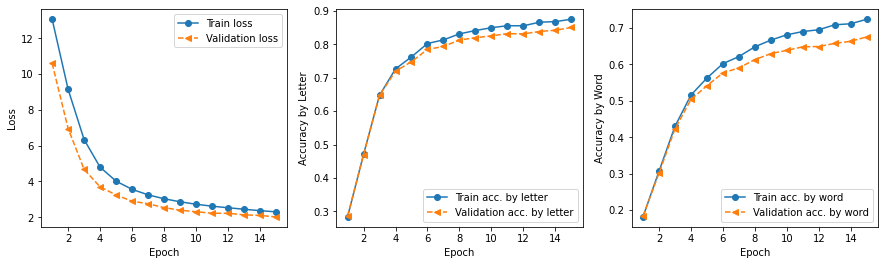

In [101]:
plot_loss_accuracy(history_e4,accuracy_callback_e4)

In [103]:
test_loss_e4 = model_e4.evaluate(test_ds, verbose=0,
                                 return_dict=True)
print('Test loss:', test_loss_e4)
preds_e4 = prediction_model_e4.predict(test_ds)
calculate_accuracies(test_labels_cleaned, preds_e4)

Test loss: {'loss': 2.10268497467041}


C:\Users\lisaw\anaconda3\lib\site-packages\keras\engine\functional.py:566: UserWarning: Input dict contained keys ['label'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


76/76 [==============================] - 11s 128ms/step


(0.842120969085514, 0.6674269127099316)

#### ```Observation: ```
- From the above Traing and Validation Loss and Accuracy graphs above, the Enhanced Model results with 15 training epochs are significant better than the Base Model results.  Test loss and accuracies are much improved over the results of the Base Model version as well. 

### Increase RNN Layers from [128, 64] to [200, 128, 64] for the Enhanced Model, and keep all other parameters the same

In [29]:
epochs = 15 

model_e = build_model_enhanced(kernel_size=(3, 3),
                               filter =[32, 64],
                               strides=(1, 1),
                               pool_size=(2, 2), 
                               learning_rate=0.001, 
                               hidden_layer_sizes=[200, 128, 64],
                               dropout=0.20,
                               optimizer='Adam', 
                               num_epochs=epochs)

prediction_model_e = keras.models.Model(model_e.get_layer(name="image").input, model_e.get_layer(name="dense2").output)
accuracy_callback_e = AccuracyCallback(prediction_model_e)

# Train the model.
history_e = model_e.fit(train_ds,
                        validation_data=validation_ds,
                        epochs=epochs,
                        callbacks=[accuracy_callback_e],
#                         verbose = 2
)

******************************************


Train Model with: kernel_size:(3, 3)\filter:[32, 64]\strides:(1, 1)\pool_size:(2, 2)\Learning_Rate:0.001\Optimizer:Adam\ epochs:15
Epoch 1/15
2/2 [==============================] - 0s 80ms/step


2/2 [==============================] - 0s 73ms/step


2/2 [==============================] - 0s 73ms/step


2/2 [==============================] - 0s 104ms/step


1/1 [==============================] - 0s 80ms/step
Training Mean accuracy by letter for epoch 1: 0.2924
Traing Mean accuracy by word for epoch 1: 0.1905
Validation Mean accuracy by letter for epoch 1: 0.2910
Validation Mean accuracy by word for epoch 1: 0.1877
1357/1357 [==============================] - 1350s 990ms/step - loss: 13.2364 - val_loss: 11.1446
Epoch 2/15
2/2 [==============================] - 0s 129ms/step


2/2 [==============================] - 0s 99ms/step


2/2 [==============================] - 0s 87ms/step


2/2 [==============================] - 0s 71ms/step


2/2 [==============================] - 0s 84ms/step


1/1 [==============================] - 0s 76ms/step
Training Mean accuracy by letter for epoch 2: 0.4321
Traing Mean accuracy by word for epoch 2: 0.2984
Validation Mean accuracy by letter for epoch 2: 0.4258
Validation Mean accuracy by word for epoch 2: 0.2934
1357/1357 [==============================] - 1389s 1s/step - loss: 9.7725 - val_loss: 8.2262
Epoch 3/15
2/2 [==============================] - 0s 86ms/step


2/2 [==============================] - 0s 90ms/step


2/2 [==============================] - 0s 84ms/step


2/2 [==============================] - 0s 82ms/step


1/1 [==============================] - 0s 69ms/step
Training Mean accuracy by letter for epoch 3: 0.6405
Traing Mean accuracy by word for epoch 3: 0.4233
Validation Mean accuracy by letter for epoch 3: 0.6342
Validation Mean accuracy by word for epoch 3: 0.4116
1357/1357 [==============================] - 1220s 899ms/step - loss: 7.1221 - val_loss: 5.1439
Epoch 4/15
2/2 [==============================] - 0s 84ms/step


2/2 [==============================] - 0s 89ms/step


2/2 [==============================] - 0s 82ms/step


2/2 [==============================] - 0s 86ms/step


2/2 [==============================] - 0s 83ms/step


1/1 [==============================] - 0s 89ms/step
Training Mean accuracy by letter for epoch 4: 0.7360
Traing Mean accuracy by word for epoch 4: 0.5238
Validation Mean accuracy by letter for epoch 4: 0.7274
Validation Mean accuracy by word for epoch 4: 0.5099
1357/1357 [==============================] - 1046s 771ms/step - loss: 4.9995 - val_loss: 3.6931
Epoch 5/15
2/2 [==============================] - 0s 109ms/step


2/2 [==============================] - 0s 108ms/step


2/2 [==============================] - 0s 107ms/step


2/2 [==============================] - 0s 108ms/step


2/2 [==============================] - 0s 108ms/step


1/1 [==============================] - 0s 110ms/step
Training Mean accuracy by letter for epoch 5: 0.7856
Traing Mean accuracy by word for epoch 5: 0.5897
Validation Mean accuracy by letter for epoch 5: 0.7663
Validation Mean accuracy by word for epoch 5: 0.5598
1357/1357 [==============================] - 1273s 939ms/step - loss: 3.9878 - val_loss: 3.1054
Epoch 6/15
2/2 [==============================] - 0s 116ms/step


2/2 [==============================] - 0s 117ms/step


2/2 [==============================] - 0s 109ms/step


2/2 [==============================] - 0s 109ms/step


1/1 [==============================] - 0s 99ms/step
Training Mean accuracy by letter for epoch 6: 0.8146
Traing Mean accuracy by word for epoch 6: 0.6316
Validation Mean accuracy by letter for epoch 6: 0.7935
Validation Mean accuracy by word for epoch 6: 0.5987
1357/1357 [==============================] - 1340s 988ms/step - loss: 3.4262 - val_loss: 2.7626
Epoch 7/15
2/2 [==============================] - 0s 111ms/step


2/2 [==============================] - 0s 109ms/step


2/2 [==============================] - 0s 107ms/step


2/2 [==============================] - 0s 121ms/step


2/2 [==============================] - 0s 110ms/step


1/1 [==============================] - 0s 105ms/step
Training Mean accuracy by letter for epoch 7: 0.8268
Traing Mean accuracy by word for epoch 7: 0.6586
Validation Mean accuracy by letter for epoch 7: 0.8013
Validation Mean accuracy by word for epoch 7: 0.6213
1357/1357 [==============================] - 1333s 983ms/step - loss: 3.0666 - val_loss: 2.5809
Epoch 8/15
2/2 [==============================] - 0s 117ms/step


2/2 [==============================] - 0s 118ms/step


2/2 [==============================] - 0s 116ms/step


2/2 [==============================] - 0s 122ms/step


2/2 [==============================] - 0s 112ms/step


1/1 [==============================] - 0s 92ms/step
Training Mean accuracy by letter for epoch 8: 0.8506
Traing Mean accuracy by word for epoch 8: 0.6841
Validation Mean accuracy by letter for epoch 8: 0.8261
Validation Mean accuracy by word for epoch 8: 0.6382
1357/1357 [==============================] - 1385s 1s/step - loss: 2.7979 - val_loss: 2.3256
Epoch 9/15
2/2 [==============================] - 0s 111ms/step


2/2 [==============================] - 0s 116ms/step


2/2 [==============================] - 0s 120ms/step


2/2 [==============================] - 0s 119ms/step


1/1 [==============================] - 0s 111ms/step
Training Mean accuracy by letter for epoch 9: 0.8649
Traing Mean accuracy by word for epoch 9: 0.7100
Validation Mean accuracy by letter for epoch 9: 0.8359
Validation Mean accuracy by word for epoch 9: 0.6583
1357/1357 [==============================] - 1404s 1s/step - loss: 2.5992 - val_loss: 2.2273
Epoch 10/15
2/2 [==============================] - 0s 125ms/step


2/2 [==============================] - 0s 127ms/step


2/2 [==============================] - 0s 130ms/step


2/2 [==============================] - 0s 134ms/step


2/2 [==============================] - 0s 127ms/step


1/1 [==============================] - 0s 126ms/step
Training Mean accuracy by letter for epoch 10: 0.8695
Traing Mean accuracy by word for epoch 10: 0.7181
Validation Mean accuracy by letter for epoch 10: 0.8403
Validation Mean accuracy by word for epoch 10: 0.6639
1357/1357 [==============================] - 1426s 1s/step - loss: 2.4240 - val_loss: 2.1868
Epoch 11/15
2/2 [==============================] - 0s 129ms/step


2/2 [==============================] - 0s 131ms/step


2/2 [==============================] - 0s 126ms/step


2/2 [==============================] - 0s 123ms/step


2/2 [==============================] - 0s 124ms/step


1/1 [==============================] - 0s 118ms/step
Training Mean accuracy by letter for epoch 11: 0.8770
Traing Mean accuracy by word for epoch 11: 0.7353
Validation Mean accuracy by letter for epoch 11: 0.8451
Validation Mean accuracy by word for epoch 11: 0.6768
1357/1357 [==============================] - 1457s 1s/step - loss: 2.2974 - val_loss: 2.0897
Epoch 12/15
2/2 [==============================] - 0s 126ms/step


2/2 [==============================] - 0s 126ms/step


2/2 [==============================] - 0s 127ms/step


2/2 [==============================] - 0s 129ms/step


1/1 [==============================] - 0s 114ms/step
Training Mean accuracy by letter for epoch 12: 0.8859
Traing Mean accuracy by word for epoch 12: 0.7465
Validation Mean accuracy by letter for epoch 12: 0.8508
Validation Mean accuracy by word for epoch 12: 0.6828
1357/1357 [==============================] - 1511s 1s/step - loss: 2.1702 - val_loss: 2.0350
Epoch 13/15
2/2 [==============================] - 0s 128ms/step


2/2 [==============================] - 0s 122ms/step


2/2 [==============================] - 0s 121ms/step


2/2 [==============================] - 0s 137ms/step


2/2 [==============================] - 0s 128ms/step


1/1 [==============================] - 0s 119ms/step
Training Mean accuracy by letter for epoch 13: 0.8866
Traing Mean accuracy by word for epoch 13: 0.7536
Validation Mean accuracy by letter for epoch 13: 0.8501
Validation Mean accuracy by word for epoch 13: 0.6879
1357/1357 [==============================] - 1514s 1s/step - loss: 2.0772 - val_loss: 2.0115
Epoch 14/15
2/2 [==============================] - 0s 130ms/step


2/2 [==============================] - 0s 129ms/step


2/2 [==============================] - 0s 128ms/step


2/2 [==============================] - 0s 129ms/step


2/2 [==============================] - 0s 131ms/step


1/1 [==============================] - 0s 118ms/step
Training Mean accuracy by letter for epoch 14: 0.9013
Traing Mean accuracy by word for epoch 14: 0.7738
Validation Mean accuracy by letter for epoch 14: 0.8604
Validation Mean accuracy by word for epoch 14: 0.7007
1357/1357 [==============================] - 1555s 1s/step - loss: 1.9954 - val_loss: 1.9004
Epoch 15/15
2/2 [==============================] - 0s 134ms/step


2/2 [==============================] - 0s 138ms/step


2/2 [==============================] - 0s 138ms/step


2/2 [==============================] - 0s 137ms/step


1/1 [==============================] - 0s 124ms/step
Training Mean accuracy by letter for epoch 15: 0.9027
Traing Mean accuracy by word for epoch 15: 0.7782
Validation Mean accuracy by letter for epoch 15: 0.8598
Validation Mean accuracy by word for epoch 15: 0.6965
1357/1357 [==============================] - 1576s 1s/step - loss: 1.9235 - val_loss: 1.8696


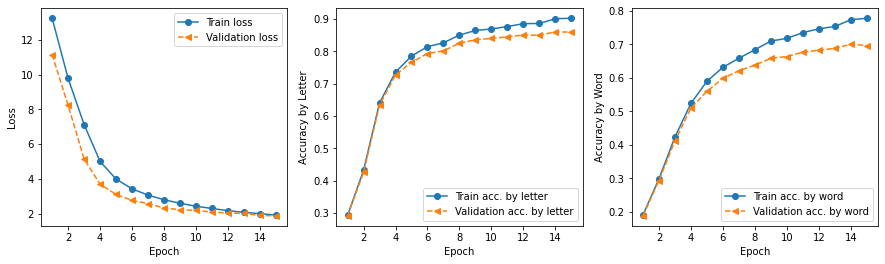

In [33]:
plot_loss_accuracy(history_e,accuracy_callback_e)

In [34]:
test_loss_e = model_e.evaluate(test_ds, verbose=0,
                                 return_dict=True)
print('Test loss:', test_loss_e)
preds_e = prediction_model_e.predict(test_ds)
calculate_accuracies(test_labels_cleaned, preds_e)

Test loss: {'loss': 1.931514024734497}


C:\Users\lisaw\anaconda3\lib\site-packages\keras\engine\functional.py:566: UserWarning: Input dict contained keys ['label'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


76/76 [==============================] - 16s 183ms/step


(0.8637405772746847, 0.7010159651669086)

#### ```Observation: ```
- When we increased RNN layers from [128, 64] to [200, 128, 64], the model results improved for 15 epochs
- Also, we noted that the validation loss and accuraries start to hit to plateau after 14-15 training epochs in this version.   We will experiment refining the parameters to see whether the model performance will improve further.

### With RNN/LSTM layers in the Enhanced Model, we see significant model prediction improvement with 15 training epochs.  The following are the key parameters

    kernel_size=(3, 3),filter =[32, 64],strides=(1, 1), pool_size=(2, 2), learning_rate=0.001, optimizer='Adam'
    hidden_layer_sizes=[200, 128, 64], dropout=0.20,

- The Enhanced Model results for 15 training epochs:
  - Training accuracy by letter: 90.3%
  - Traing accuracy by word: 77.8%
  - Validation accuracy by letter: 86.0%
  - Validation accuracy by word: 69.7%
  - Test Accuracy by letter: 86.4%
  - Test Accuracy by word: 70.1%

###  We will experiment refining the parameters to see whether the model performance will improve over the above results

#### Experiment: Change kernel size from (3,3) to (2, 2), keeping the other parameters the same

In [30]:

epochs = 15 

model_e2 = build_model_enhanced(kernel_size=(2, 2),
                               filter =[32, 64],
                               strides=(1, 1),
                               pool_size=(2, 2), 
                               learning_rate=0.001, 
                               hidden_layer_sizes=[200, 128, 64],
                               dropout=0.20,
                               optimizer='Adam', 
                               num_epochs=epochs)

prediction_model_e2 = keras.models.Model(model_e2.get_layer(name="image").input, model_e2.get_layer(name="dense2").output)
accuracy_callback_e2 = AccuracyCallback(prediction_model_e2)

# Train the model.
history_e2 = model_e2.fit(train_ds,
                        validation_data=validation_ds,
                        epochs=epochs,
                        callbacks=[accuracy_callback_e2],
#                         verbose = 2
)

******************************************


Train Model with: kernel_size:(2, 2)\filter:[32, 64]\strides:(1, 1)\pool_size:(2, 2)\Learning_Rate:0.001\Optimizer:Adam\ epochs:15
Epoch 1/15
2/2 [==============================] - 0s 89ms/step


2/2 [==============================] - 0s 86ms/step


2/2 [==============================] - 0s 82ms/step


2/2 [==============================] - 0s 71ms/step


1/1 [==============================] - 0s 65ms/step
Training Mean accuracy by letter for epoch 1: 0.2839
Traing Mean accuracy by word for epoch 1: 0.1854
Validation Mean accuracy by letter for epoch 1: 0.2823
Validation Mean accuracy by word for epoch 1: 0.1822
1357/1357 [==============================] - 1221s 895ms/step - loss: 13.1944 - val_loss: 11.1764
Epoch 2/15
2/2 [==============================] - 0s 91ms/step


2/2 [==============================] - 0s 83ms/step


2/2 [==============================] - 0s 87ms/step


2/2 [==============================] - 0s 91ms/step


2/2 [==============================] - 0s 89ms/step


1/1 [==============================] - 0s 81ms/step
Training Mean accuracy by letter for epoch 2: 0.4173
Traing Mean accuracy by word for epoch 2: 0.2845
Validation Mean accuracy by letter for epoch 2: 0.4145
Validation Mean accuracy by word for epoch 2: 0.2819
1357/1357 [==============================] - 1112s 820ms/step - loss: 9.9404 - val_loss: 8.4482
Epoch 3/15
2/2 [==============================] - 0s 96ms/step


2/2 [==============================] - 0s 97ms/step


2/2 [==============================] - 0s 91ms/step


2/2 [==============================] - 0s 94ms/step


1/1 [==============================] - 0s 85ms/step
Training Mean accuracy by letter for epoch 3: 0.5634
Traing Mean accuracy by word for epoch 3: 0.3727
Validation Mean accuracy by letter for epoch 3: 0.5530
Validation Mean accuracy by word for epoch 3: 0.3670
1357/1357 [==============================] - 1149s 847ms/step - loss: 7.6566 - val_loss: 6.0122
Epoch 4/15
2/2 [==============================] - 0s 94ms/step


2/2 [==============================] - 0s 93ms/step


2/2 [==============================] - 0s 96ms/step


2/2 [==============================] - 0s 97ms/step


2/2 [==============================] - 0s 95ms/step


1/1 [==============================] - 0s 90ms/step
Training Mean accuracy by letter for epoch 4: 0.6730
Traing Mean accuracy by word for epoch 4: 0.4735
Validation Mean accuracy by letter for epoch 4: 0.6619
Validation Mean accuracy by word for epoch 4: 0.4611
1357/1357 [==============================] - 1150s 848ms/step - loss: 5.7695 - val_loss: 4.3867
Epoch 5/15
2/2 [==============================] - 0s 103ms/step


2/2 [==============================] - 0s 107ms/step


2/2 [==============================] - 0s 104ms/step


2/2 [==============================] - 0s 107ms/step


1/1 [==============================] - 0s 96ms/step
Training Mean accuracy by letter for epoch 5: 0.7377
Traing Mean accuracy by word for epoch 5: 0.5419
Validation Mean accuracy by letter for epoch 5: 0.7228
Validation Mean accuracy by word for epoch 5: 0.5224
1357/1357 [==============================] - 1177s 868ms/step - loss: 4.6548 - val_loss: 3.5747


Epoch 6/15
2/2 [==============================] - 0s 109ms/step


2/2 [==============================] - 0s 111ms/step


2/2 [==============================] - 0s 110ms/step


2/2 [==============================] - 0s 110ms/step


1/1 [==============================] - 0s 90ms/step
Training Mean accuracy by letter for epoch 6: 0.7818
Traing Mean accuracy by word for epoch 6: 0.5940
Validation Mean accuracy by letter for epoch 6: 0.7608
Validation Mean accuracy by word for epoch 6: 0.5666
1357/1357 [==============================] - 1208s 891ms/step - loss: 3.9872 - val_loss: 3.1577
Epoch 7/15
2/2 [==============================] - 0s 114ms/step


2/2 [==============================] - 0s 112ms/step


2/2 [==============================] - 0s 110ms/step


2/2 [==============================] - 0s 111ms/step


2/2 [==============================] - 0s 122ms/step


1/1 [==============================] - 0s 89ms/step
Training Mean accuracy by letter for epoch 7: 0.8033
Traing Mean accuracy by word for epoch 7: 0.6232
Validation Mean accuracy by letter for epoch 7: 0.7773
Validation Mean accuracy by word for epoch 7: 0.5835
1357/1357 [==============================] - 1240s 914ms/step - loss: 3.5536 - val_loss: 2.8592
Epoch 8/15
2/2 [==============================] - 0s 108ms/step


2/2 [==============================] - 0s 111ms/step


2/2 [==============================] - 0s 112ms/step


2/2 [==============================] - 0s 113ms/step


1/1 [==============================] - 0s 90ms/step
Training Mean accuracy by letter for epoch 8: 0.8232
Traing Mean accuracy by word for epoch 8: 0.6527
Validation Mean accuracy by letter for epoch 8: 0.7961
Validation Mean accuracy by word for epoch 8: 0.6086
1357/1357 [==============================] - 1246s 919ms/step - loss: 3.2389 - val_loss: 2.6538


Epoch 9/15
2/2 [==============================] - 0s 116ms/step


2/2 [==============================] - 0s 115ms/step


2/2 [==============================] - 0s 114ms/step


2/2 [==============================] - 0s 115ms/step


1/1 [==============================] - 0s 92ms/step
Training Mean accuracy by letter for epoch 9: 0.8301
Traing Mean accuracy by word for epoch 9: 0.6680
Validation Mean accuracy by letter for epoch 9: 0.7999
Validation Mean accuracy by word for epoch 9: 0.6277
1357/1357 [==============================] - 1286s 948ms/step - loss: 3.0003 - val_loss: 2.5614
Epoch 10/15
2/2 [==============================] - 0s 118ms/step


2/2 [==============================] - 0s 120ms/step


2/2 [==============================] - 0s 124ms/step


2/2 [==============================] - 0s 123ms/step


2/2 [==============================] - 0s 119ms/step


1/1 [==============================] - 0s 97ms/step
Training Mean accuracy by letter for epoch 10: 0.8505
Traing Mean accuracy by word for epoch 10: 0.6959
Validation Mean accuracy by letter for epoch 10: 0.8181
Validation Mean accuracy by word for epoch 10: 0.6443
1357/1357 [==============================] - 1313s 968ms/step - loss: 2.7875 - val_loss: 2.3674
Epoch 11/15
2/2 [==============================] - 0s 118ms/step


2/2 [==============================] - 0s 124ms/step


2/2 [==============================] - 0s 122ms/step


2/2 [==============================] - 0s 121ms/step


1/1 [==============================] - 0s 103ms/step
Training Mean accuracy by letter for epoch 11: 0.8579
Traing Mean accuracy by word for epoch 11: 0.7085
Validation Mean accuracy by letter for epoch 11: 0.8244
Validation Mean accuracy by word for epoch 11: 0.6525


1357/1357 [==============================] - 1333s 982ms/step - loss: 2.6383 - val_loss: 2.2904
Epoch 12/15
2/2 [==============================] - 0s 123ms/step


2/2 [==============================] - 0s 123ms/step


2/2 [==============================] - 0s 125ms/step


2/2 [==============================] - 0s 128ms/step


1/1 [==============================] - 0s 106ms/step
Training Mean accuracy by letter for epoch 12: 0.8673
Traing Mean accuracy by word for epoch 12: 0.7212
Validation Mean accuracy by letter for epoch 12: 0.8315
Validation Mean accuracy by word for epoch 12: 0.6628
1357/1357 [==============================] - 1364s 1s/step - loss: 2.4923 - val_loss: 2.2237
Epoch 13/15
2/2 [==============================] - 0s 126ms/step


2/2 [==============================] - 0s 125ms/step


2/2 [==============================] - 0s 123ms/step


2/2 [==============================] - 0s 127ms/step


2/2 [==============================] - 0s 123ms/step


1/1 [==============================] - 0s 103ms/step
Training Mean accuracy by letter for epoch 13: 0.8778
Traing Mean accuracy by word for epoch 13: 0.7392
Validation Mean accuracy by letter for epoch 13: 0.8397
Validation Mean accuracy by word for epoch 13: 0.6735
1357/1357 [==============================] - 1390s 1s/step - loss: 2.4001 - val_loss: 2.1083
Epoch 14/15
2/2 [==============================] - 0s 132ms/step


2/2 [==============================] - 0s 130ms/step


2/2 [==============================] - 0s 141ms/step


2/2 [==============================] - 0s 129ms/step


2/2 [==============================] - 0s 131ms/step


1/1 [==============================] - 0s 119ms/step
Training Mean accuracy by letter for epoch 14: 0.8776
Traing Mean accuracy by word for epoch 14: 0.7433
Validation Mean accuracy by letter for epoch 14: 0.8348
Validation Mean accuracy by word for epoch 14: 0.6708
1357/1357 [==============================] - 1424s 1s/step - loss: 2.2904 - val_loss: 2.1232
Epoch 15/15
2/2 [==============================] - 0s 131ms/step


2/2 [==============================] - 0s 130ms/step


2/2 [==============================] - 0s 130ms/step


2/2 [==============================] - 0s 133ms/step


1/1 [==============================] - 0s 113ms/step
Training Mean accuracy by letter for epoch 15: 0.8877
Traing Mean accuracy by word for epoch 15: 0.7564
Validation Mean accuracy by letter for epoch 15: 0.8438
Validation Mean accuracy by word for epoch 15: 0.6844
1357/1357 [==============================] - 1436s 1s/step - loss: 2.2105 - val_loss: 2.0109


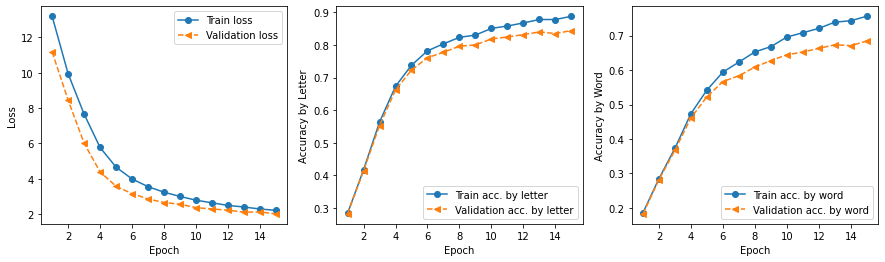

In [36]:
plot_loss_accuracy(history_e2,accuracy_callback_e2)

In [35]:
test_loss_e2 = model_e2.evaluate(test_ds, verbose=0,
                                 return_dict=True)
print('Test loss:', test_loss_e2)
preds_e2 = prediction_model_e2.predict(test_ds)
calculate_accuracies(test_labels_cleaned, preds_e2)

Test loss: {'loss': 2.107912540435791}


C:\Users\lisaw\anaconda3\lib\site-packages\keras\engine\functional.py:566: UserWarning: Input dict contained keys ['label'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


76/76 [==============================] - 15s 171ms/step


(0.843280015478336, 0.6846361185983828)

#### ```Observation: ``` 
- Changing kernel size from (3, 3) to (2, 2) did not improve the model performance

In [27]:
def train_and_evaluate(kernel_size=(3, 3),
                       filter =[32, 64],
                       strides=(1, 1),
                       pool_size=(2, 2),
                       learning_rate=0.001,
                       optimizer='Adam',
                       dropout=0.20,
                       hidden_layer_sizes=[200, 128, 64],
                       num_epochs=15):
    """ train and evaluate"""
#     start_line = f'kernel_size:{kernel_size}\\strides:{strides}\\pool_size:{pool_size}\\Learning_Rate:{learning_rate}\\Optimizer:{optimizer}\\ epochs:{num_epochs}'
#     print(f'******************************************')
#     print(f'\n\nTrain and Evaluate with: {start_line}')
    
    start_time = time.time()
    # Build the model.
    tf.random.set_seed(1)
    model = build_model_enhanced(kernel_size=kernel_size,
                                 filter =[32, 64],
                                 strides=strides,
                                 pool_size=pool_size,
                                 learning_rate=learning_rate,
                                 optimizer=optimizer,
                                 dropout=dropout,
                                 hidden_layer_sizes=hidden_layer_sizes,
                                 num_epochs=num_epochs
    )
    
    # prediction
    prediction_model = keras.models.Model(model.get_layer(name="image").input, model.get_layer(name="dense2").output)
    accuracy_callback = AccuracyCallback(prediction_model)
    
    # model parameter count
    total_train_param = sum(count_params(layer) for layer in model.trainable_weights) 
    
    # Train the model
    tf.random.set_seed(1234)
    np.random.seed(1234)
    
    history = model.fit(train_ds, validation_data=validation_ds,
                        epochs=num_epochs,
                        callbacks=[accuracy_callback],
#                         verbose = 2
                       )
    
    # plot loss, accuracy by letter, and accuracy by word
    plot_loss_accuracy(history,accuracy_callback)
    
    # get final training and validation results by loss and accuracy
    train_loss = history.history['loss'][-1]
    val_loss = history.history['val_loss'][-1]
    train_acc_letter = accuracy_callback.history['acc_letter'][-1:]
    val_acc_letter = accuracy_callback.history['val_acc_letter'][-1:]
    train_acc_word = accuracy_callback.history['acc_word'][-1:]
    val_acc_word = accuracy_callback.history['val_acc_word'][-1:]

    # evaluate test results
    test_loss = model.evaluate(test_ds, verbose=0,
                                 return_dict=True)
    preds = prediction_model.predict(test_ds)
    test_acc_letter, test_acc_word = calculate_accuracies(test_labels_cleaned, preds)
    
    # measure time
    time_elapsed_mins = round(time.time() - start_time, 1)/60
    
    # print out the results
    final_line = f'Train_time:{time_elapsed_mins} in minutes|parameters:{total_train_param}\
    |train loss:{train_loss}|val loss:{val_loss}\
    |train accuracy by letter:{train_acc_letter}|validation accuracy by letter:{val_acc_letter}\
    |train accuracy by word:{train_acc_word}|validation accuracy by word:{val_acc_word}\
    |test loss:{test_loss}|test accuracy by letter:{test_acc_letter}|test accuracy by word:{test_acc_word}'
    print(f'\n\nFinal Results: {final_line}')
    
        
    return test_acc_letter, test_acc_word

#### Experiment: Change Kernel size from (3,3) to (2,2) and change drop out rate from 0.20 to 0.25

******************************************


Train Model with: kernel_size:(2, 2)\filter:[32, 64]\strides:(1, 1)\pool_size:(2, 2)\Learning_Rate:0.001\Optimizer:Adam\ epochs:35
Epoch 1/35
2/2 [==============================] - 0s 170ms/step


2/2 [==============================] - 0s 169ms/step


2/2 [==============================] - 0s 166ms/step


2/2 [==============================] - 0s 168ms/step


1/1 [==============================] - 0s 157ms/step
Training Mean accuracy by letter for epoch 1: 0.2829
Traing Mean accuracy by word for epoch 1: 0.1908
Validation Mean accuracy by letter for epoch 1: 0.2810
Validation Mean accuracy by word for epoch 1: 0.1881
1357/1357 [==============================] - 1678s 1s/step - loss: 13.2110 - val_loss: 11.1574
Epoch 2/35
2/2 [==============================] - 0s 170ms/step


2/2 [==============================] - 0s 166ms/step


2/2 [==============================] - 0s 151ms/step


2/2 [==============================] - 0s 147ms/step


2/2 [==============================] - 0s 147ms/step


1/1 [==============================] - 0s 130ms/step
Training Mean accuracy by letter for epoch 2: 0.4083
Traing Mean accuracy by word for epoch 2: 0.2838
Validation Mean accuracy by letter for epoch 2: 0.4029
Validation Mean accuracy by word for epoch 2: 0.2821
1357/1357 [==============================] - 1606s 1s/step - loss: 9.9322 - val_loss: 8.4393
Epoch 3/35
2/2 [==============================] - 0s 155ms/step


2/2 [==============================] - 0s 154ms/step


2/2 [==============================] - 0s 163ms/step


2/2 [==============================] - 0s 153ms/step


2/2 [==============================] - 0s 156ms/step


1/1 [==============================] - 0s 136ms/step
Training Mean accuracy by letter for epoch 3: 0.5741
Traing Mean accuracy by word for epoch 3: 0.3820
Validation Mean accuracy by letter for epoch 3: 0.5673
Validation Mean accuracy by word for epoch 3: 0.3729
1357/1357 [==============================] - 1582s 1s/step - loss: 7.6923 - val_loss: 5.9189
Epoch 4/35
2/2 [==============================] - 0s 153ms/step


2/2 [==============================] - 0s 149ms/step


2/2 [==============================] - 0s 153ms/step


2/2 [==============================] - 0s 152ms/step


1/1 [==============================] - 0s 139ms/step
Training Mean accuracy by letter for epoch 4: 0.6772
Traing Mean accuracy by word for epoch 4: 0.4674
Validation Mean accuracy by letter for epoch 4: 0.6712
Validation Mean accuracy by word for epoch 4: 0.4544
1357/1357 [==============================] - 1603s 1s/step - loss: 5.8765 - val_loss: 4.5062
Epoch 5/35
2/2 [==============================] - 0s 157ms/step


2/2 [==============================] - 0s 155ms/step


2/2 [==============================] - 0s 157ms/step


2/2 [==============================] - 0s 158ms/step


2/2 [==============================] - 0s 157ms/step


1/1 [==============================] - 0s 147ms/step
Training Mean accuracy by letter for epoch 5: 0.7380
Traing Mean accuracy by word for epoch 5: 0.5314
Validation Mean accuracy by letter for epoch 5: 0.7252
Validation Mean accuracy by word for epoch 5: 0.5152
1357/1357 [==============================] - 1595s 1s/step - loss: 4.8172 - val_loss: 3.7948
Epoch 6/35
2/2 [==============================] - 0s 170ms/step


2/2 [==============================] - 0s 176ms/step


2/2 [==============================] - 0s 171ms/step


2/2 [==============================] - 0s 172ms/step


2/2 [==============================] - 0s 158ms/step


1/1 [==============================] - 0s 137ms/step
Training Mean accuracy by letter for epoch 6: 0.7765
Traing Mean accuracy by word for epoch 6: 0.5773
Validation Mean accuracy by letter for epoch 6: 0.7579
Validation Mean accuracy by word for epoch 6: 0.5535
1357/1357 [==============================] - 1687s 1s/step - loss: 4.2031 - val_loss: 3.3556
Epoch 7/35
2/2 [==============================] - 0s 163ms/step


2/2 [==============================] - 0s 169ms/step


2/2 [==============================] - 0s 168ms/step


2/2 [==============================] - 0s 167ms/step


1/1 [==============================] - 0s 143ms/step
Training Mean accuracy by letter for epoch 7: 0.8037
Traing Mean accuracy by word for epoch 7: 0.6169
Validation Mean accuracy by letter for epoch 7: 0.7844
Validation Mean accuracy by word for epoch 7: 0.5913
1357/1357 [==============================] - 1688s 1s/step - loss: 3.7896 - val_loss: 2.9712
Epoch 8/35
2/2 [==============================] - 0s 169ms/step


2/2 [==============================] - 0s 164ms/step


2/2 [==============================] - 0s 164ms/step


2/2 [==============================] - 0s 170ms/step


2/2 [==============================] - 0s 165ms/step


1/1 [==============================] - 0s 147ms/step
Training Mean accuracy by letter for epoch 8: 0.8111
Traing Mean accuracy by word for epoch 8: 0.6322
Validation Mean accuracy by letter for epoch 8: 0.7886
Validation Mean accuracy by word for epoch 8: 0.6042
1357/1357 [==============================] - 1703s 1s/step - loss: 3.4974 - val_loss: 2.8755
Epoch 9/35
2/2 [==============================] - 0s 168ms/step


2/2 [==============================] - 0s 168ms/step


2/2 [==============================] - 0s 165ms/step


2/2 [==============================] - 0s 170ms/step


2/2 [==============================] - 0s 165ms/step


1/1 [==============================] - 0s 140ms/step
Training Mean accuracy by letter for epoch 9: 0.8338
Traing Mean accuracy by word for epoch 9: 0.6607
Validation Mean accuracy by letter for epoch 9: 0.8095
Validation Mean accuracy by word for epoch 9: 0.6215
1357/1357 [==============================] - 1729s 1s/step - loss: 3.2390 - val_loss: 2.6377
Epoch 10/35
2/2 [==============================] - 0s 168ms/step


2/2 [==============================] - 0s 173ms/step


2/2 [==============================] - 0s 177ms/step


2/2 [==============================] - 0s 180ms/step


1/1 [==============================] - 0s 140ms/step
Training Mean accuracy by letter for epoch 10: 0.8393
Traing Mean accuracy by word for epoch 10: 0.6717
Validation Mean accuracy by letter for epoch 10: 0.8162
Validation Mean accuracy by word for epoch 10: 0.6310
1357/1357 [==============================] - 1723s 1s/step - loss: 3.0710 - val_loss: 2.5347
Epoch 11/35
2/2 [==============================] - 0s 175ms/step


2/2 [==============================] - 0s 173ms/step


2/2 [==============================] - 0s 171ms/step


2/2 [==============================] - 0s 173ms/step


2/2 [==============================] - 0s 176ms/step


1/1 [==============================] - 0s 146ms/step
Training Mean accuracy by letter for epoch 11: 0.8462
Traing Mean accuracy by word for epoch 11: 0.6879
Validation Mean accuracy by letter for epoch 11: 0.8169
Validation Mean accuracy by word for epoch 11: 0.6423
1357/1357 [==============================] - 1739s 1s/step - loss: 2.9053 - val_loss: 2.5083
Epoch 12/35
2/2 [==============================] - 0s 179ms/step


2/2 [==============================] - 0s 183ms/step


2/2 [==============================] - 0s 182ms/step


2/2 [==============================] - 0s 182ms/step


2/2 [==============================] - 0s 178ms/step


1/1 [==============================] - 0s 152ms/step
Training Mean accuracy by letter for epoch 12: 0.8552
Traing Mean accuracy by word for epoch 12: 0.6957
Validation Mean accuracy by letter for epoch 12: 0.8268
Validation Mean accuracy by word for epoch 12: 0.6470
1357/1357 [==============================] - 1772s 1s/step - loss: 2.7667 - val_loss: 2.4257
Epoch 13/35
2/2 [==============================] - 0s 182ms/step


2/2 [==============================] - 0s 182ms/step


2/2 [==============================] - 0s 189ms/step


2/2 [==============================] - 0s 187ms/step


1/1 [==============================] - 0s 149ms/step
Training Mean accuracy by letter for epoch 13: 0.8668
Traing Mean accuracy by word for epoch 13: 0.7143
Validation Mean accuracy by letter for epoch 13: 0.8324
Validation Mean accuracy by word for epoch 13: 0.6536
1357/1357 [==============================] - 1785s 1s/step - loss: 2.6679 - val_loss: 2.3082
Epoch 14/35
2/2 [==============================] - 0s 190ms/step


2/2 [==============================] - 0s 190ms/step


2/2 [==============================] - 0s 189ms/step


2/2 [==============================] - 0s 193ms/step


2/2 [==============================] - 0s 191ms/step


1/1 [==============================] - 0s 163ms/step
Training Mean accuracy by letter for epoch 14: 0.8707
Traing Mean accuracy by word for epoch 14: 0.7249
Validation Mean accuracy by letter for epoch 14: 0.8356
Validation Mean accuracy by word for epoch 14: 0.6659
1357/1357 [==============================] - 1808s 1s/step - loss: 2.5614 - val_loss: 2.2412
Epoch 15/35
2/2 [==============================] - 0s 218ms/step


2/2 [==============================] - 0s 193ms/step


2/2 [==============================] - 0s 196ms/step


2/2 [==============================] - 0s 197ms/step


2/2 [==============================] - 0s 190ms/step


1/1 [==============================] - 0s 159ms/step
Training Mean accuracy by letter for epoch 15: 0.8770
Traing Mean accuracy by word for epoch 15: 0.7324
Validation Mean accuracy by letter for epoch 15: 0.8448
Validation Mean accuracy by word for epoch 15: 0.6801
1357/1357 [==============================] - 1787s 1s/step - loss: 2.4709 - val_loss: 2.2071
Epoch 16/35
2/2 [==============================] - 0s 190ms/step


2/2 [==============================] - 0s 207ms/step


2/2 [==============================] - 0s 194ms/step


2/2 [==============================] - 0s 199ms/step


1/1 [==============================] - 0s 160ms/step
Training Mean accuracy by letter for epoch 16: 0.8826
Traing Mean accuracy by word for epoch 16: 0.7413
Validation Mean accuracy by letter for epoch 16: 0.8468
Validation Mean accuracy by word for epoch 16: 0.6787
1357/1357 [==============================] - 1771s 1s/step - loss: 2.4000 - val_loss: 2.1546
Epoch 17/35
2/2 [==============================] - 0s 195ms/step


2/2 [==============================] - 0s 194ms/step


2/2 [==============================] - 0s 197ms/step


2/2 [==============================] - 0s 195ms/step


2/2 [==============================] - 0s 198ms/step


1/1 [==============================] - 0s 161ms/step
Training Mean accuracy by letter for epoch 17: 0.8818
Traing Mean accuracy by word for epoch 17: 0.7442
Validation Mean accuracy by letter for epoch 17: 0.8464
Validation Mean accuracy by word for epoch 17: 0.6836
1357/1357 [==============================] - 1793s 1s/step - loss: 2.3252 - val_loss: 2.1709
Epoch 18/35
2/2 [==============================] - 0s 202ms/step


2/2 [==============================] - 0s 189ms/step


2/2 [==============================] - 0s 200ms/step


2/2 [==============================] - 0s 199ms/step


2/2 [==============================] - 0s 198ms/step


1/1 [==============================] - 0s 180ms/step
Training Mean accuracy by letter for epoch 18: 0.8890
Traing Mean accuracy by word for epoch 18: 0.7566
Validation Mean accuracy by letter for epoch 18: 0.8566
Validation Mean accuracy by word for epoch 18: 0.6974
1357/1357 [==============================] - 1819s 1s/step - loss: 2.2717 - val_loss: 2.0416
Epoch 19/35
2/2 [==============================] - 0s 203ms/step


2/2 [==============================] - 0s 208ms/step


2/2 [==============================] - 0s 206ms/step


2/2 [==============================] - 0s 209ms/step


1/1 [==============================] - 0s 182ms/step
Training Mean accuracy by letter for epoch 19: 0.8937
Traing Mean accuracy by word for epoch 19: 0.7613
Validation Mean accuracy by letter for epoch 19: 0.8540
Validation Mean accuracy by word for epoch 19: 0.6968
1357/1357 [==============================] - 1892s 1s/step - loss: 2.2017 - val_loss: 2.0715
Epoch 20/35
2/2 [==============================] - 0s 212ms/step


2/2 [==============================] - 0s 214ms/step


2/2 [==============================] - 0s 216ms/step


2/2 [==============================] - 0s 213ms/step


2/2 [==============================] - 0s 228ms/step


1/1 [==============================] - 0s 161ms/step
Training Mean accuracy by letter for epoch 20: 0.8968
Traing Mean accuracy by word for epoch 20: 0.7682
Validation Mean accuracy by letter for epoch 20: 0.8568
Validation Mean accuracy by word for epoch 20: 0.6978
1357/1357 [==============================] - 1922s 1s/step - loss: 2.1561 - val_loss: 2.0247
Epoch 21/35
2/2 [==============================] - 0s 218ms/step


2/2 [==============================] - 0s 216ms/step


2/2 [==============================] - 0s 215ms/step


2/2 [==============================] - 0s 217ms/step


2/2 [==============================] - 0s 221ms/step


1/1 [==============================] - 0s 177ms/step
Training Mean accuracy by letter for epoch 21: 0.9019
Traing Mean accuracy by word for epoch 21: 0.7778
Validation Mean accuracy by letter for epoch 21: 0.8581
Validation Mean accuracy by word for epoch 21: 0.7025
1357/1357 [==============================] - 1947s 1s/step - loss: 2.1048 - val_loss: 1.9907
Epoch 22/35
2/2 [==============================] - 0s 228ms/step


2/2 [==============================] - 0s 221ms/step


2/2 [==============================] - 0s 219ms/step


2/2 [==============================] - 0s 217ms/step


1/1 [==============================] - 0s 174ms/step
Training Mean accuracy by letter for epoch 22: 0.9035
Traing Mean accuracy by word for epoch 22: 0.7803
Validation Mean accuracy by letter for epoch 22: 0.8612
Validation Mean accuracy by word for epoch 22: 0.7025
1357/1357 [==============================] - 1986s 1s/step - loss: 2.0569 - val_loss: 1.9645
Epoch 23/35
2/2 [==============================] - 0s 224ms/step


2/2 [==============================] - 0s 221ms/step


2/2 [==============================] - 0s 221ms/step


2/2 [==============================] - 0s 220ms/step


2/2 [==============================] - 0s 220ms/step


1/1 [==============================] - 0s 172ms/step
Training Mean accuracy by letter for epoch 23: 0.9056
Traing Mean accuracy by word for epoch 23: 0.7857
Validation Mean accuracy by letter for epoch 23: 0.8603
Validation Mean accuracy by word for epoch 23: 0.7033
1357/1357 [==============================] - 1955s 1s/step - loss: 2.0167 - val_loss: 1.9481
Epoch 24/35
2/2 [==============================] - 0s 248ms/step


2/2 [==============================] - 0s 228ms/step


2/2 [==============================] - 0s 229ms/step


2/2 [==============================] - 0s 225ms/step


2/2 [==============================] - 0s 224ms/step


1/1 [==============================] - 0s 161ms/step
Training Mean accuracy by letter for epoch 24: 0.9056
Traing Mean accuracy by word for epoch 24: 0.7835
Validation Mean accuracy by letter for epoch 24: 0.8604
Validation Mean accuracy by word for epoch 24: 0.7042
1357/1357 [==============================] - 1977s 1s/step - loss: 1.9897 - val_loss: 1.9982
Epoch 25/35
2/2 [==============================] - 0s 233ms/step


2/2 [==============================] - 1s 249ms/step


2/2 [==============================] - 0s 230ms/step


2/2 [==============================] - 1s 275ms/step


1/1 [==============================] - 0s 174ms/step
Training Mean accuracy by letter for epoch 25: 0.9076
Traing Mean accuracy by word for epoch 25: 0.7903
Validation Mean accuracy by letter for epoch 25: 0.8648
Validation Mean accuracy by word for epoch 25: 0.7103
1357/1357 [==============================] - 2084s 2s/step - loss: 1.9812 - val_loss: 1.9319
Epoch 26/35
2/2 [==============================] - 0s 240ms/step


2/2 [==============================] - 0s 242ms/step


2/2 [==============================] - 1s 244ms/step


2/2 [==============================] - 0s 233ms/step


2/2 [==============================] - 0s 238ms/step


1/1 [==============================] - 0s 201ms/step
Training Mean accuracy by letter for epoch 26: 0.9110
Traing Mean accuracy by word for epoch 26: 0.7937
Validation Mean accuracy by letter for epoch 26: 0.8681
Validation Mean accuracy by word for epoch 26: 0.7163
1357/1357 [==============================] - 2061s 2s/step - loss: 1.9113 - val_loss: 1.9514
Epoch 27/35
2/2 [==============================] - 1s 241ms/step


2/2 [==============================] - 1s 249ms/step


2/2 [==============================] - 1s 244ms/step


2/2 [==============================] - 1s 255ms/step


2/2 [==============================] - 0s 200ms/step


1/1 [==============================] - 0s 153ms/step
Training Mean accuracy by letter for epoch 27: 0.9162
Traing Mean accuracy by word for epoch 27: 0.8074
Validation Mean accuracy by letter for epoch 27: 0.8643
Validation Mean accuracy by word for epoch 27: 0.7169
1357/1357 [==============================] - 2052s 2s/step - loss: 1.8683 - val_loss: 1.8650
Epoch 28/35
2/2 [==============================] - 0s 238ms/step


2/2 [==============================] - 0s 231ms/step


2/2 [==============================] - 0s 235ms/step


2/2 [==============================] - 0s 237ms/step


1/1 [==============================] - 0s 168ms/step
Training Mean accuracy by letter for epoch 28: 0.9140
Traing Mean accuracy by word for epoch 28: 0.8020
Validation Mean accuracy by letter for epoch 28: 0.8657
Validation Mean accuracy by word for epoch 28: 0.7120
1357/1357 [==============================] - 2004s 1s/step - loss: 1.8476 - val_loss: 1.8522
Epoch 29/35
2/2 [==============================] - 0s 239ms/step


2/2 [==============================] - 0s 245ms/step


2/2 [==============================] - 0s 237ms/step


2/2 [==============================] - 0s 242ms/step


2/2 [==============================] - 0s 241ms/step


1/1 [==============================] - 0s 180ms/step
Training Mean accuracy by letter for epoch 29: 0.9185
Traing Mean accuracy by word for epoch 29: 0.8098
Validation Mean accuracy by letter for epoch 29: 0.8712
Validation Mean accuracy by word for epoch 29: 0.7214
1357/1357 [==============================] - 2074s 2s/step - loss: 1.8329 - val_loss: 1.8289


Epoch 30/35
2/2 [==============================] - 1s 243ms/step


2/2 [==============================] - 1s 242ms/step


2/2 [==============================] - 0s 236ms/step


2/2 [==============================] - 0s 241ms/step


1/1 [==============================] - 0s 169ms/step
Training Mean accuracy by letter for epoch 30: 0.9185
Traing Mean accuracy by word for epoch 30: 0.8112
Validation Mean accuracy by letter for epoch 30: 0.8706
Validation Mean accuracy by word for epoch 30: 0.7227
1357/1357 [==============================] - 2102s 2s/step - loss: 1.7907 - val_loss: 1.8483
Epoch 31/35
2/2 [==============================] - 1s 251ms/step


2/2 [==============================] - 0s 250ms/step


2/2 [==============================] - 1s 249ms/step


2/2 [==============================] - 0s 222ms/step


2/2 [==============================] - 0s 222ms/step


1/1 [==============================] - 0s 168ms/step
Training Mean accuracy by letter for epoch 31: 0.9210
Traing Mean accuracy by word for epoch 31: 0.8157
Validation Mean accuracy by letter for epoch 31: 0.8684
Validation Mean accuracy by word for epoch 31: 0.7183
1357/1357 [==============================] - 2122s 2s/step - loss: 1.7788 - val_loss: 1.8285
Epoch 32/35
2/2 [==============================] - 1s 256ms/step


2/2 [==============================] - 1s 253ms/step


2/2 [==============================] - 1s 247ms/step


2/2 [==============================] - 1s 251ms/step


1/1 [==============================] - 0s 187ms/step
Training Mean accuracy by letter for epoch 32: 0.9231
Traing Mean accuracy by word for epoch 32: 0.8220
Validation Mean accuracy by letter for epoch 32: 0.8741
Validation Mean accuracy by word for epoch 32: 0.7317
1357/1357 [==============================] - 2161s 2s/step - loss: 1.7391 - val_loss: 1.7801


Epoch 33/35
2/2 [==============================] - 0s 244ms/step


2/2 [==============================] - 1s 245ms/step


2/2 [==============================] - 1s 248ms/step


2/2 [==============================] - 1s 261ms/step


1/1 [==============================] - 0s 181ms/step
Training Mean accuracy by letter for epoch 33: 0.9226
Traing Mean accuracy by word for epoch 33: 0.8202
Validation Mean accuracy by letter for epoch 33: 0.8680
Validation Mean accuracy by word for epoch 33: 0.7188
1357/1357 [==============================] - 2201s 2s/step - loss: 1.7147 - val_loss: 1.8340
Epoch 34/35
2/2 [==============================] - 1s 257ms/step


2/2 [==============================] - 1s 257ms/step


2/2 [==============================] - 1s 257ms/step


2/2 [==============================] - 1s 253ms/step


2/2 [==============================] - 1s 262ms/step


1/1 [==============================] - 0s 188ms/step
Training Mean accuracy by letter for epoch 34: 0.9254
Traing Mean accuracy by word for epoch 34: 0.8259
Validation Mean accuracy by letter for epoch 34: 0.8726
Validation Mean accuracy by word for epoch 34: 0.7251
1357/1357 [==============================] - 2226s 2s/step - loss: 1.6978 - val_loss: 1.8593
Epoch 35/35
2/2 [==============================] - 1s 258ms/step


2/2 [==============================] - 1s 258ms/step


2/2 [==============================] - 1s 260ms/step


2/2 [==============================] - 1s 266ms/step


1/1 [==============================] - 0s 187ms/step
Training Mean accuracy by letter for epoch 35: 0.9194
Traing Mean accuracy by word for epoch 35: 0.8135
Validation Mean accuracy by letter for epoch 35: 0.8721
Validation Mean accuracy by word for epoch 35: 0.7177
1357/1357 [==============================] - 2258s 2s/step - loss: 1.6871 - val_loss: 1.8829


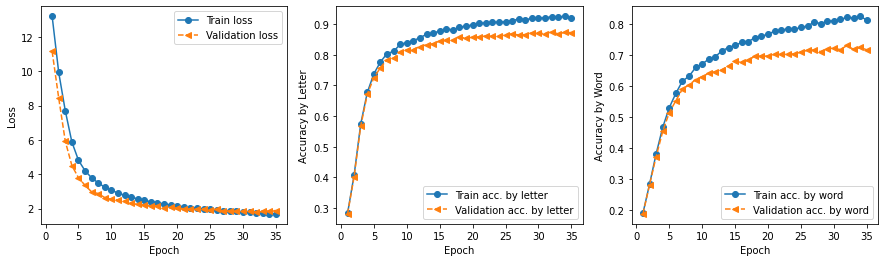

C:\Users\lisaw\anaconda3\lib\site-packages\keras\engine\functional.py:566: UserWarning: Input dict contained keys ['label'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


76/76 [==============================] - 27s 327ms/step


Final Results: Train_time:1099.1966666666667 in minutes|parameters:1181745    |train loss:1.6871299743652344|val loss:1.8828562498092651    |train accuracy by letter:[0.9194005932324688]|validation accuracy by letter:[0.8720545621985765]    |train accuracy by word:[0.8134787214443626]|validation accuracy by word:[0.7177220394736842]    |test loss:{'loss': 1.897956371307373}|test accuracy by letter:0.8663539052119811|test accuracy by word:0.7109682770060128


(0.8663539052119811, 0.7109682770060128)

In [41]:
train_and_evaluate(kernel_size=(2, 2),
                   filter =[32, 64],
                   strides=(1, 1),
                   pool_size=(2, 2),
                   learning_rate=0.001,
                   optimizer='Adam',
                   dropout=0.25,
                   hidden_layer_sizes=[200, 128, 64],
                   num_epochs=35)

#### ```Observation:``` When changing kernel size from (3,3) to (2,2) and change drop out rate from 0.20 to 0.25 and also increase the traing epochs from 15 to 35, the model performance has improved over the prior model version when kernal size is (3,3) and drop out rate is 0.20 with 15 epochs 

- The prior Enhanced Model results (Kernal Size (3,3) and drop out rate of 0.20) for 15 training epochs:
  - Training accuracy by letter: 90.3%
  - Traing accuracy by word: 77.8%
  - Validation accuracy by letter: 86.0%
  - Validation accuracy by word: 69.7%
  - Test Accuracy by letter: 86.4%
  - Test Accuracy by word: 70.1%
  
  
- This Enhanced Model results (Kernal Size (2,2) and drop out rate of 0.25) for 35 training epochs:
  - Training accuracy by letter: 91.9%
  - Traing accuracy by word: 81.3%
  - Validation accuracy by letter: 87.2%
  - Validation accuracy by word: 71.8%
  - Test Accuracy by letter: 86.6%
  - Test Accuracy by word: 71.1%  

### Next:  We will keep kernel size (3,3) and dropout rate of 0.25 for the final Enhanced Model version and increase the training epochs from 15 to 35 and see whether we will see further performance enhancement

## Final parameters for the Enhanced Model (CNN + RNN + CTC)

In [28]:
epochs = 35  

model_e3 = build_model_enhanced (kernel_size=(3, 3),
                                       filter =[32, 64],
                                       strides=(1, 1),
                                       pool_size=(2, 2),
                                       learning_rate=0.001,
                                       optimizer='Adam', 
                                       hidden_layer_sizes=[200, 128, 64],
                                       dropout=0.25,
                                       num_epochs=epochs)

prediction_model_e3 = keras.models.Model(model_e3.get_layer(name="image").input, 
                                               model_e3.get_layer(name="dense2").output)
accuracy_callback_e3 = AccuracyCallback(prediction_model_e3)

# Train the model
history_e3 = model_e3.fit(train_ds,
                          validation_data=validation_ds,
                          epochs=epochs,
                          callbacks=[accuracy_callback_e3],
#                           verbose = 2
)

******************************************


Train Model with: kernel_size:(3, 3)\filter:[32, 64]\strides:(1, 1)\pool_size:(2, 2)\Learning_Rate:0.001\Optimizer:Adam\ epochs:35
Epoch 1/35
2/2 [==============================] - 0s 75ms/step


2/2 [==============================] - 0s 71ms/step


2/2 [==============================] - 0s 71ms/step


2/2 [==============================] - 0s 109ms/step


1/1 [==============================] - 0s 91ms/step
Training Mean accuracy by letter for epoch 1: 0.2924
Traing Mean accuracy by word for epoch 1: 0.1948
Validation Mean accuracy by letter for epoch 1: 0.2906
Validation Mean accuracy by word for epoch 1: 0.1937
1357/1357 [==============================] - 1347s 988ms/step - loss: 13.1875 - val_loss: 11.2495
Epoch 2/35
2/2 [==============================] - 0s 164ms/step


2/2 [==============================] - 0s 94ms/step


2/2 [==============================] - 0s 73ms/step


2/2 [==============================] - 0s 71ms/step


2/2 [==============================] - 0s 78ms/step


1/1 [==============================] - 0s 70ms/step
Training Mean accuracy by letter for epoch 2: 0.4327
Traing Mean accuracy by word for epoch 2: 0.2955
Validation Mean accuracy by letter for epoch 2: 0.4275
Validation Mean accuracy by word for epoch 2: 0.2930
1357/1357 [==============================] - 1593s 1s/step - loss: 9.8281 - val_loss: 8.1680
Epoch 3/35
2/2 [==============================] - 0s 77ms/step


2/2 [==============================] - 0s 76ms/step


2/2 [==============================] - 0s 79ms/step


2/2 [==============================] - 0s 77ms/step


1/1 [==============================] - 0s 62ms/step
Training Mean accuracy by letter for epoch 3: 0.6263
Traing Mean accuracy by word for epoch 3: 0.4155
Validation Mean accuracy by letter for epoch 3: 0.6241
Validation Mean accuracy by word for epoch 3: 0.4028
1357/1357 [==============================] - 1144s 844ms/step - loss: 7.1377 - val_loss: 5.2246
Epoch 4/35
2/2 [==============================] - 0s 79ms/step


2/2 [==============================] - 0s 83ms/step


2/2 [==============================] - 0s 84ms/step


2/2 [==============================] - 0s 82ms/step


2/2 [==============================] - 0s 83ms/step


1/1 [==============================] - 0s 81ms/step
Training Mean accuracy by letter for epoch 4: 0.7299
Traing Mean accuracy by word for epoch 4: 0.5142
Validation Mean accuracy by letter for epoch 4: 0.7180
Validation Mean accuracy by word for epoch 4: 0.4977
1357/1357 [==============================] - 1041s 767ms/step - loss: 5.2263 - val_loss: 3.8966
Epoch 5/35
2/2 [==============================] - 0s 99ms/step


2/2 [==============================] - 0s 111ms/step


2/2 [==============================] - 0s 108ms/step


2/2 [==============================] - 0s 108ms/step


2/2 [==============================] - 0s 106ms/step


1/1 [==============================] - 0s 93ms/step
Training Mean accuracy by letter for epoch 5: 0.7722
Traing Mean accuracy by word for epoch 5: 0.5773
Validation Mean accuracy by letter for epoch 5: 0.7568
Validation Mean accuracy by word for epoch 5: 0.5621
1357/1357 [==============================] - 1330s 980ms/step - loss: 4.2307 - val_loss: 3.2815
Epoch 6/35
2/2 [==============================] - 0s 111ms/step


2/2 [==============================] - 0s 111ms/step


2/2 [==============================] - 0s 112ms/step


2/2 [==============================] - 0s 115ms/step


1/1 [==============================] - 0s 102ms/step
Training Mean accuracy by letter for epoch 6: 0.8067
Traing Mean accuracy by word for epoch 6: 0.6193
Validation Mean accuracy by letter for epoch 6: 0.7882
Validation Mean accuracy by word for epoch 6: 0.5948
1357/1357 [==============================] - 1395s 1s/step - loss: 3.6787 - val_loss: 2.8542
Epoch 7/35
2/2 [==============================] - 0s 108ms/step


2/2 [==============================] - 0s 110ms/step


2/2 [==============================] - 0s 110ms/step


2/2 [==============================] - 0s 112ms/step


2/2 [==============================] - 0s 99ms/step


1/1 [==============================] - 0s 106ms/step
Training Mean accuracy by letter for epoch 7: 0.8234
Traing Mean accuracy by word for epoch 7: 0.6454
Validation Mean accuracy by letter for epoch 7: 0.8037
Validation Mean accuracy by word for epoch 7: 0.6155
1357/1357 [==============================] - 1387s 1s/step - loss: 3.3077 - val_loss: 2.6728
Epoch 8/35
2/2 [==============================] - 0s 109ms/step


2/2 [==============================] - 0s 110ms/step


2/2 [==============================] - 0s 109ms/step


2/2 [==============================] - 0s 112ms/step


2/2 [==============================] - 0s 108ms/step


1/1 [==============================] - 0s 85ms/step
Training Mean accuracy by letter for epoch 8: 0.8332
Traing Mean accuracy by word for epoch 8: 0.6655
Validation Mean accuracy by letter for epoch 8: 0.8112
Validation Mean accuracy by word for epoch 8: 0.6324
1357/1357 [==============================] - 1342s 989ms/step - loss: 3.0374 - val_loss: 2.5214
Epoch 9/35
2/2 [==============================] - 0s 116ms/step


2/2 [==============================] - 0s 117ms/step


2/2 [==============================] - 0s 118ms/step


2/2 [==============================] - 0s 125ms/step


2/2 [==============================] - 0s 118ms/step


1/1 [==============================] - 0s 119ms/step
Training Mean accuracy by letter for epoch 9: 0.8523
Traing Mean accuracy by word for epoch 9: 0.6917
Validation Mean accuracy by letter for epoch 9: 0.8307
Validation Mean accuracy by word for epoch 9: 0.6484
1357/1357 [==============================] - 1320s 973ms/step - loss: 2.8332 - val_loss: 2.3138
Epoch 10/35
2/2 [==============================] - 0s 125ms/step


2/2 [==============================] - 0s 131ms/step


2/2 [==============================] - 0s 130ms/step


2/2 [==============================] - 0s 125ms/step


1/1 [==============================] - 0s 145ms/step
Training Mean accuracy by letter for epoch 10: 0.8614
Traing Mean accuracy by word for epoch 10: 0.7083
Validation Mean accuracy by letter for epoch 10: 0.8315
Validation Mean accuracy by word for epoch 10: 0.6556
1357/1357 [==============================] - 1447s 1s/step - loss: 2.6707 - val_loss: 2.2447
Epoch 11/35
2/2 [==============================] - 0s 131ms/step


2/2 [==============================] - 0s 133ms/step


2/2 [==============================] - 0s 129ms/step


2/2 [==============================] - 0s 127ms/step


2/2 [==============================] - 0s 131ms/step


1/1 [==============================] - 0s 123ms/step
Training Mean accuracy by letter for epoch 11: 0.8710
Traing Mean accuracy by word for epoch 11: 0.7212
Validation Mean accuracy by letter for epoch 11: 0.8443
Validation Mean accuracy by word for epoch 11: 0.6733
1357/1357 [==============================] - 1506s 1s/step - loss: 2.5410 - val_loss: 2.1371
Epoch 12/35
2/2 [==============================] - 0s 138ms/step


2/2 [==============================] - 0s 134ms/step


2/2 [==============================] - 0s 134ms/step


2/2 [==============================] - 0s 132ms/step


2/2 [==============================] - 0s 135ms/step


1/1 [==============================] - 0s 136ms/step
Training Mean accuracy by letter for epoch 12: 0.8759
Traing Mean accuracy by word for epoch 12: 0.7310
Validation Mean accuracy by letter for epoch 12: 0.8454
Validation Mean accuracy by word for epoch 12: 0.6745
1357/1357 [==============================] - 1570s 1s/step - loss: 2.4231 - val_loss: 2.0994
Epoch 13/35
2/2 [==============================] - 0s 130ms/step


2/2 [==============================] - 0s 130ms/step


2/2 [==============================] - 0s 129ms/step


2/2 [==============================] - 0s 129ms/step


1/1 [==============================] - 0s 108ms/step
Training Mean accuracy by letter for epoch 13: 0.8804
Traing Mean accuracy by word for epoch 13: 0.7394
Validation Mean accuracy by letter for epoch 13: 0.8461
Validation Mean accuracy by word for epoch 13: 0.6782
1357/1357 [==============================] - 1465s 1s/step - loss: 2.3357 - val_loss: 2.0845
Epoch 14/35
2/2 [==============================] - 0s 136ms/step


2/2 [==============================] - 0s 150ms/step


2/2 [==============================] - 0s 154ms/step


2/2 [==============================] - 0s 152ms/step


2/2 [==============================] - 0s 151ms/step


1/1 [==============================] - 0s 134ms/step
Training Mean accuracy by letter for epoch 14: 0.8896
Traing Mean accuracy by word for epoch 14: 0.7553
Validation Mean accuracy by letter for epoch 14: 0.8544
Validation Mean accuracy by word for epoch 14: 0.6883
1357/1357 [==============================] - 1537s 1s/step - loss: 2.2364 - val_loss: 1.9717
Epoch 15/35
2/2 [==============================] - 0s 157ms/step


2/2 [==============================] - 0s 150ms/step


2/2 [==============================] - 0s 156ms/step


2/2 [==============================] - 0s 154ms/step


2/2 [==============================] - 0s 154ms/step


1/1 [==============================] - 0s 140ms/step
Training Mean accuracy by letter for epoch 15: 0.8918
Traing Mean accuracy by word for epoch 15: 0.7595
Validation Mean accuracy by letter for epoch 15: 0.8535
Validation Mean accuracy by word for epoch 15: 0.6898
1357/1357 [==============================] - 1636s 1s/step - loss: 2.1704 - val_loss: 1.9996
Epoch 16/35
2/2 [==============================] - 0s 159ms/step


2/2 [==============================] - 0s 155ms/step


2/2 [==============================] - 0s 162ms/step


2/2 [==============================] - 0s 161ms/step


1/1 [==============================] - 0s 146ms/step
Training Mean accuracy by letter for epoch 16: 0.8952
Traing Mean accuracy by word for epoch 16: 0.7649
Validation Mean accuracy by letter for epoch 16: 0.8575
Validation Mean accuracy by word for epoch 16: 0.6978
1357/1357 [==============================] - 1682s 1s/step - loss: 2.1124 - val_loss: 1.9144
Epoch 17/35
2/2 [==============================] - 0s 164ms/step


2/2 [==============================] - 0s 160ms/step


2/2 [==============================] - 0s 160ms/step


2/2 [==============================] - 0s 157ms/step


2/2 [==============================] - 0s 163ms/step


1/1 [==============================] - 0s 163ms/step
Training Mean accuracy by letter for epoch 17: 0.9001
Traing Mean accuracy by word for epoch 17: 0.7770
Validation Mean accuracy by letter for epoch 17: 0.8638
Validation Mean accuracy by word for epoch 17: 0.7056
1357/1357 [==============================] - 1734s 1s/step - loss: 2.0305 - val_loss: 1.8623
Epoch 18/35
2/2 [==============================] - 0s 162ms/step


2/2 [==============================] - 0s 160ms/step


2/2 [==============================] - 0s 158ms/step


2/2 [==============================] - 0s 156ms/step


2/2 [==============================] - 0s 166ms/step


1/1 [==============================] - 0s 121ms/step
Training Mean accuracy by letter for epoch 18: 0.9022
Traing Mean accuracy by word for epoch 18: 0.7785
Validation Mean accuracy by letter for epoch 18: 0.8662
Validation Mean accuracy by word for epoch 18: 0.7064
1357/1357 [==============================] - 1660s 1s/step - loss: 1.9907 - val_loss: 1.8707
Epoch 19/35
2/2 [==============================] - 0s 171ms/step


2/2 [==============================] - 0s 174ms/step


2/2 [==============================] - 0s 170ms/step


2/2 [==============================] - 0s 169ms/step


1/1 [==============================] - 0s 143ms/step
Training Mean accuracy by letter for epoch 19: 0.9078
Traing Mean accuracy by word for epoch 19: 0.7897
Validation Mean accuracy by letter for epoch 19: 0.8713
Validation Mean accuracy by word for epoch 19: 0.7179
1357/1357 [==============================] - 1675s 1s/step - loss: 1.9326 - val_loss: 1.7855
Epoch 20/35
2/2 [==============================] - 0s 178ms/step


2/2 [==============================] - 0s 171ms/step


2/2 [==============================] - 0s 170ms/step


2/2 [==============================] - 0s 175ms/step


2/2 [==============================] - 0s 174ms/step


1/1 [==============================] - 0s 156ms/step
Training Mean accuracy by letter for epoch 20: 0.9100
Traing Mean accuracy by word for epoch 20: 0.7935
Validation Mean accuracy by letter for epoch 20: 0.8713
Validation Mean accuracy by word for epoch 20: 0.7175
1357/1357 [==============================] - 1742s 1s/step - loss: 1.9020 - val_loss: 1.7697
Epoch 21/35
2/2 [==============================] - 0s 174ms/step


2/2 [==============================] - 0s 174ms/step


2/2 [==============================] - 0s 168ms/step


2/2 [==============================] - 0s 174ms/step


2/2 [==============================] - 0s 172ms/step


1/1 [==============================] - 0s 162ms/step
Training Mean accuracy by letter for epoch 21: 0.9104
Traing Mean accuracy by word for epoch 21: 0.7977
Validation Mean accuracy by letter for epoch 21: 0.8677
Validation Mean accuracy by word for epoch 21: 0.7163
1357/1357 [==============================] - 1805s 1s/step - loss: 1.8426 - val_loss: 1.7819
Epoch 22/35
2/2 [==============================] - 0s 187ms/step


2/2 [==============================] - 0s 186ms/step


2/2 [==============================] - 0s 188ms/step


2/2 [==============================] - 0s 185ms/step


1/1 [==============================] - 0s 158ms/step
Training Mean accuracy by letter for epoch 22: 0.9159
Traing Mean accuracy by word for epoch 22: 0.8056
Validation Mean accuracy by letter for epoch 22: 0.8704
Validation Mean accuracy by word for epoch 22: 0.7155
1357/1357 [==============================] - 1909s 1s/step - loss: 1.8169 - val_loss: 1.7605
Epoch 23/35
2/2 [==============================] - 0s 192ms/step


2/2 [==============================] - 0s 190ms/step


2/2 [==============================] - 0s 183ms/step


2/2 [==============================] - 0s 179ms/step


2/2 [==============================] - 0s 180ms/step


1/1 [==============================] - 0s 139ms/step
Training Mean accuracy by letter for epoch 23: 0.9160
Traing Mean accuracy by word for epoch 23: 0.8056
Validation Mean accuracy by letter for epoch 23: 0.8739
Validation Mean accuracy by word for epoch 23: 0.7235
1357/1357 [==============================] - 1958s 1s/step - loss: 1.7726 - val_loss: 1.7379
Epoch 24/35
2/2 [==============================] - 0s 184ms/step


2/2 [==============================] - 0s 187ms/step


2/2 [==============================] - 0s 184ms/step


2/2 [==============================] - 0s 183ms/step


2/2 [==============================] - 0s 185ms/step


1/1 [==============================] - 0s 150ms/step
Training Mean accuracy by letter for epoch 24: 0.9193
Traing Mean accuracy by word for epoch 24: 0.8129
Validation Mean accuracy by letter for epoch 24: 0.8760
Validation Mean accuracy by word for epoch 24: 0.7257
1357/1357 [==============================] - 1928s 1s/step - loss: 1.7288 - val_loss: 1.6920
Epoch 25/35
2/2 [==============================] - 0s 188ms/step


2/2 [==============================] - 0s 188ms/step


2/2 [==============================] - 0s 190ms/step


2/2 [==============================] - 0s 189ms/step


1/1 [==============================] - 0s 160ms/step
Training Mean accuracy by letter for epoch 25: 0.9189
Traing Mean accuracy by word for epoch 25: 0.8127
Validation Mean accuracy by letter for epoch 25: 0.8736
Validation Mean accuracy by word for epoch 25: 0.7239
1357/1357 [==============================] - 1964s 1s/step - loss: 1.7040 - val_loss: 1.7489
Epoch 26/35
2/2 [==============================] - 0s 206ms/step - loss: 1.


2/2 [==============================] - 0s 205ms/step


2/2 [==============================] - 0s 194ms/step


2/2 [==============================] - 0s 201ms/step


2/2 [==============================] - 0s 232ms/step


1/1 [==============================] - 0s 182ms/step
Training Mean accuracy by letter for epoch 26: 0.9209
Traing Mean accuracy by word for epoch 26: 0.8183
Validation Mean accuracy by letter for epoch 26: 0.8786
Validation Mean accuracy by word for epoch 26: 0.7319
1357/1357 [==============================] - 2029s 1s/step - loss: 1.6710 - val_loss: 1.6911
Epoch 27/35
2/2 [==============================] - 0s 200ms/step


2/2 [==============================] - 0s 196ms/step


2/2 [==============================] - 0s 195ms/step


2/2 [==============================] - 0s 193ms/step


2/2 [==============================] - 0s 212ms/step


1/1 [==============================] - 0s 171ms/step
Training Mean accuracy by letter for epoch 27: 0.9258
Traing Mean accuracy by word for epoch 27: 0.8251
Validation Mean accuracy by letter for epoch 27: 0.8826
Validation Mean accuracy by word for epoch 27: 0.7438
1357/1357 [==============================] - 1926s 1s/step - loss: 1.6423 - val_loss: 1.6475
Epoch 28/35
2/2 [==============================] - 0s 200ms/step


2/2 [==============================] - 0s 202ms/step


2/2 [==============================] - 0s 202ms/step


2/2 [==============================] - 0s 203ms/step


1/1 [==============================] - 0s 149ms/step
Training Mean accuracy by letter for epoch 28: 0.9283
Traing Mean accuracy by word for epoch 28: 0.8319
Validation Mean accuracy by letter for epoch 28: 0.8804
Validation Mean accuracy by word for epoch 28: 0.7360
1357/1357 [==============================] - 2122s 2s/step - loss: 1.6088 - val_loss: 1.6984


Epoch 29/35
2/2 [==============================] - 0s 218ms/step


2/2 [==============================] - 0s 220ms/step


2/2 [==============================] - 0s 239ms/step


2/2 [==============================] - 0s 215ms/step


1/1 [==============================] - 0s 161ms/step
Training Mean accuracy by letter for epoch 29: 0.9290
Traing Mean accuracy by word for epoch 29: 0.8339
Validation Mean accuracy by letter for epoch 29: 0.8789
Validation Mean accuracy by word for epoch 29: 0.7366
1357/1357 [==============================] - 2162s 2s/step - loss: 1.5881 - val_loss: 1.6523
Epoch 30/35
2/2 [==============================] - 0s 221ms/step


2/2 [==============================] - 0s 219ms/step


2/2 [==============================] - 0s 249ms/step


2/2 [==============================] - 0s 226ms/step


2/2 [==============================] - 0s 218ms/step


1/1 [==============================] - 0s 163ms/step
Training Mean accuracy by letter for epoch 30: 0.9290
Traing Mean accuracy by word for epoch 30: 0.8346
Validation Mean accuracy by letter for epoch 30: 0.8794
Validation Mean accuracy by word for epoch 30: 0.7325
1357/1357 [==============================] - 2223s 2s/step - loss: 1.5526 - val_loss: 1.6677
Epoch 31/35
2/2 [==============================] - 0s 221ms/step


2/2 [==============================] - 0s 216ms/step


2/2 [==============================] - 0s 217ms/step


2/2 [==============================] - 0s 221ms/step


1/1 [==============================] - 0s 165ms/step
Training Mean accuracy by letter for epoch 31: 0.9305
Traing Mean accuracy by word for epoch 31: 0.8382
Validation Mean accuracy by letter for epoch 31: 0.8809
Validation Mean accuracy by word for epoch 31: 0.7389
1357/1357 [==============================] - 2309s 2s/step - loss: 1.5307 - val_loss: 1.6595


Epoch 32/35
2/2 [==============================] - 0s 221ms/step


2/2 [==============================] - 0s 220ms/step


2/2 [==============================] - 0s 225ms/step


2/2 [==============================] - 0s 225ms/step


1/1 [==============================] - 0s 182ms/step
Training Mean accuracy by letter for epoch 32: 0.9329
Traing Mean accuracy by word for epoch 32: 0.8399
Validation Mean accuracy by letter for epoch 32: 0.8816
Validation Mean accuracy by word for epoch 32: 0.7377
1357/1357 [==============================] - 2321s 2s/step - loss: 1.5201 - val_loss: 1.6511
Epoch 33/35
2/2 [==============================] - 0s 231ms/step


2/2 [==============================] - 0s 234ms/step


2/2 [==============================] - 0s 229ms/step


2/2 [==============================] - 0s 225ms/step


2/2 [==============================] - 0s 230ms/step


1/1 [==============================] - 0s 174ms/step
Training Mean accuracy by letter for epoch 33: 0.9319
Traing Mean accuracy by word for epoch 33: 0.8415
Validation Mean accuracy by letter for epoch 33: 0.8803
Validation Mean accuracy by word for epoch 33: 0.7381
1357/1357 [==============================] - 2385s 2s/step - loss: 1.5014 - val_loss: 1.6702
Epoch 34/35
2/2 [==============================] - 0s 238ms/step


2/2 [==============================] - 0s 234ms/step


2/2 [==============================] - 0s 230ms/step


2/2 [==============================] - 0s 236ms/step


1/1 [==============================] - 0s 170ms/step
Training Mean accuracy by letter for epoch 34: 0.9330
Traing Mean accuracy by word for epoch 34: 0.8445
Validation Mean accuracy by letter for epoch 34: 0.8809
Validation Mean accuracy by word for epoch 34: 0.7420
1357/1357 [==============================] - 2499s 2s/step - loss: 1.4775 - val_loss: 1.6873


Epoch 35/35
2/2 [==============================] - 0s 238ms/step


2/2 [==============================] - 0s 234ms/step


2/2 [==============================] - 0s 241ms/step


2/2 [==============================] - 0s 234ms/step


1/1 [==============================] - 0s 182ms/step
Training Mean accuracy by letter for epoch 35: 0.9370
Traing Mean accuracy by word for epoch 35: 0.8515
Validation Mean accuracy by letter for epoch 35: 0.8858
Validation Mean accuracy by word for epoch 35: 0.7455
1357/1357 [==============================] - 2354s 2s/step - loss: 1.4502 - val_loss: 1.6093


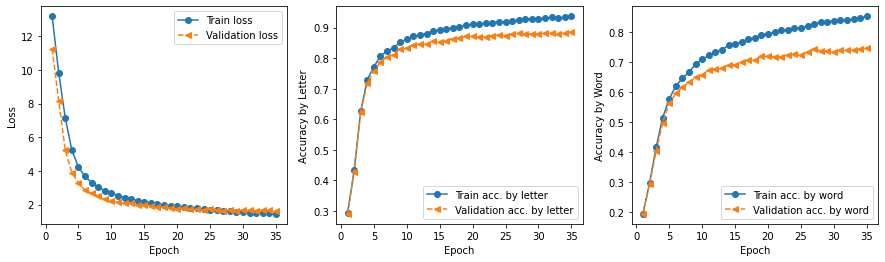

In [31]:
plot_loss_accuracy(history_e3,accuracy_callback_e3)

In [32]:
# Evaluate the model performance for test data
#################################################################################

test_loss_e3 = model_e3.evaluate(test_ds, verbose=0, return_dict=True)
print('Test loss:', test_loss_e3)
preds_e3 = prediction_model_e3.predict(test_ds)
calculate_accuracies(test_labels_cleaned, preds_e3)

Test loss: {'loss': 1.6853824853897095}


C:\Users\lisaw\anaconda3\lib\site-packages\keras\engine\functional.py:566: UserWarning: Input dict contained keys ['label'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)


76/76 [==============================] - 24s 295ms/step


(0.8849982786122119, 0.7507775243624301)

### Conclusion on the Enhanced Model:  
- With 35 trainng epochs, we used the following settings and observed further model performance improvement, in compared to the 15 training epochs 

  kernel_size=(3, 3), filter =[32, 64], strides=(1, 1), pool_size=(2, 2), learning_rate=0.001, optimizer='Adam', 
  hidden_layer_sizes=[200, 128, 64], dropout=0.25

- The Enhanced Model Results for 35 training epochs:
    - Training accuracy by letter: 93.7%
    - Traing accuracy by word: 85.2%
    - Validation accuracy by letter: 88.6%
    - Validation accuracy by word: 74.6%
    - Test Accuracy by letter: 88.5%
    - Test Accuracy by word: 75.1%

In [36]:
pred_texts_e3 = decode_batch_predictions(preds_e3)

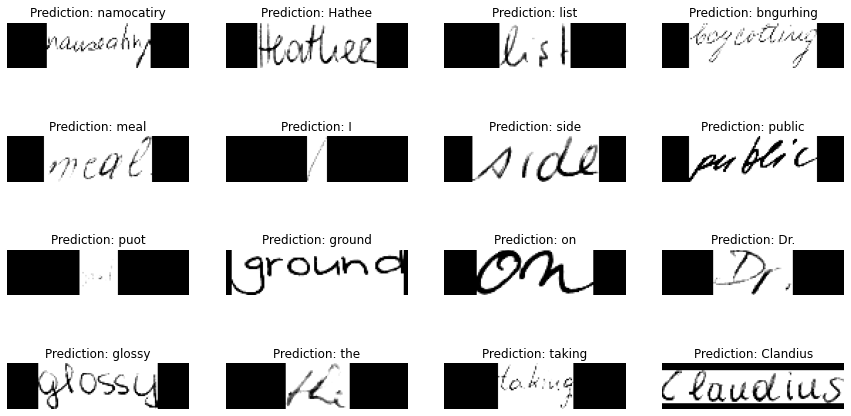

In [82]:
#  Let's check results on some test samples.
for batch in test_ds.take(1):
    batch_images = batch["image"]

    _, ax = plt.subplots(4, 4, figsize=(15, 8))

#     preds_e3 = prediction_model_e3.predict(batch_images)
#     pred_texts_e3 = decode_batch_predictions(preds_e3)

    for i in range(16):
        img = batch_images[i]
        img = tf.image.flip_left_right(img)
        img = tf.transpose(img, perm=[1, 0, 2])
        img = (img * 255.0).numpy().clip(0, 255).astype(np.uint8)
        img = img[:, :, 0]

        title = f"Prediction: {pred_texts_e3[i]}"
        ax[i // 4, i % 4].imshow(img, cmap="gray")
        ax[i // 4, i % 4].set_title(title)
        ax[i // 4, i % 4].axis("off")

plt.show()

In [40]:
print(classification_report(test_labels_cleaned, pred_texts_e3))

                  precision    recall  f1-score   support

               !       0.75      1.00      0.86         3
               "       0.95      0.83      0.88        64
               #       1.00      0.20      0.33         5
               &       1.00      0.75      0.86         4
              &e       0.00      0.00      0.00         0
               '       0.00      0.00      0.00        21
              'd       1.00      1.00      1.00         1
             'll       1.00      0.50      0.67         2
              'm       1.00      1.00      1.00         2
             're       1.00      1.00      1.00         4
              's       1.00      1.00      1.00         6
             've       1.00      1.00      1.00         1
               (       1.00      1.00      1.00         4
               )       1.00      1.00      1.00         2
            +3.6       0.00      0.00      0.00         1
               ,       0.87      0.96      0.91       222
             

C:\Users\lisaw\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\lisaw\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\lisaw\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\lisaw\anaconda3\lib\site-packages\sklearn\metrics\_cla

### Our Enhanced Model performs much better than the Base Model, as shown in the model runs above.  Next, we will add the NLP Spell Check to see whether we can further improve the model predictions

# Section 6. Target Model (CNN + RNN/LSTM + CTC + NLP Spell Check

In [42]:
#Add NLP spell check to improve Accuracy of test data predictions

spell_corrected_preds = [spell(label) for label in pred_texts_e3]


In [43]:
print(classification_report(test_labels_cleaned, spell_corrected_preds))

                  precision    recall  f1-score   support

               !       0.75      1.00      0.86         3
               "       0.95      0.83      0.88        64
               #       1.00      0.20      0.33         5
               &       1.00      0.75      0.86         4
              &e       0.00      0.00      0.00         0
               '       0.00      0.00      0.00        21
              'd       1.00      1.00      1.00         1
             'll       1.00      0.50      0.67         2
              'm       1.00      1.00      1.00         2
             're       1.00      1.00      1.00         4
              's       1.00      1.00      1.00         6
             've       1.00      1.00      1.00         1
               (       1.00      1.00      1.00         4
               )       1.00      1.00      1.00         2
            +3.6       0.00      0.00      0.00         1
               ,       0.87      0.96      0.91       222
             

C:\Users\lisaw\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\lisaw\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\lisaw\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\lisaw\anaconda3\lib\site-packages\sklearn\metrics\_cla

In [44]:
print("Predictions:", pred_texts_e3[6:10])
print("Actuals:", test_labels_cleaned[6:10])
print("Spell Corrected:", spell_corrected_preds[6:10])

Predictions: ['side', 'public', 'puot', 'ground']
Actuals: ['side', 'public', 'guest', 'ground']
Spell Corrected: ['side', 'public', 'quot', 'ground']


In [75]:
final_results = pd.DataFrame(columns=["actual", "prediction", "corrected_predictions"])
final_results["actual"] = test_labels_cleaned
final_results["prediction"] = pred_texts_e3
final_results["spell_check_predictions"] = spell_corrected_preds
final_results["accuracy_by_word_no_spell_check"] = final_results["actual"] == final_results["prediction"]
final_results["accuracy_by_word_with_spell_check"] = final_results["actual"] == final_results["spell_check_predictions"]

acc_word_no_spell = len(final_results[final_results["accuracy_by_word_no_spell_check"]==True])/len(final_results)
acc_word_with_spell = len(final_results[final_results["accuracy_by_word_with_spell_check"]==True])/len(final_results)

def accuracy_by_letter(pred, actual):
    max_length = max(len(pred), len(actual))
    min_length = min(len(pred), len(actual))
    
    letters_correct = 0
    
    for i in range(min_length):
        if pred[i] == actual[i]:
            letters_correct += 1
    
    return letters_correct / max_length
    
final_results['acc_letter_no_spell'] = final_results.apply(lambda x: accuracy_by_letter(x.actual, x.prediction), axis=1)
final_results['acc_letter_with_spell'] = final_results.apply(lambda x: accuracy_by_letter(x.actual, x.spell_check_predictions), axis=1)

acc_letter_no_spell = final_results['acc_letter_no_spell'].mean()
acc_letter_with_spell = final_results['acc_letter_with_spell'].mean()


print(f"Accuracy by word, no spell check: {acc_word_no_spell:.4f}")
print(f"Accuracy by word, with spell check: {acc_word_with_spell:.4f}")
print(f"Accuracy by letter, no spell check: {acc_letter_no_spell:.4f}")
print(f"Accuracy by letter, with spell check: {acc_letter_with_spell:.4f}")

Accuracy by word, no spell check: 0.7508
Accuracy by word, with spell check: 0.8119
Accuracy by letter, no spell check: 0.8850
Accuracy by letter, with spell check: 0.8904


### From the above comparison, we noted that the NLP Spell Check improves the model predictions of test data

- Accuracy by letter improves marginally from 88.5% to 89.1%
- Accuracy by word improves significantly from 75.1% to 81.2%

#### The table below shows 365 words that benefited from the NLP Spell Check function

In [83]:
spell_check_improved = final_results.query('accuracy_by_word_no_spell_check==False & accuracy_by_word_with_spell_check ==True')

spell_check_improved = spell_check_improved[['actual','prediction','spell_check_predictions', 'acc_letter_no_spell','acc_letter_with_spell']]
spell_check_improved

,actual,prediction,spell_check_predictions,acc_letter_no_spell,acc_letter_with_spell
15,Claudius,Clandius,Claudius,0.875000,1.0
31,close,clote,close,0.800000,1.0
66,occasionally,occaoronally,occasionally,0.833333,1.0
71,fresh,fresk,fresh,0.800000,1.0
73,appear,appoan,appear,0.666667,1.0
...,...,...,...,...,...
4665,notches,notehes,notches,0.857143,1.0
4725,evidence,edivence,evidence,0.750000,1.0
4743,help,holp,help,0.750000,1.0
4764,must,murt,must,0.750000,1.0


####  Let's check results on some test samples.

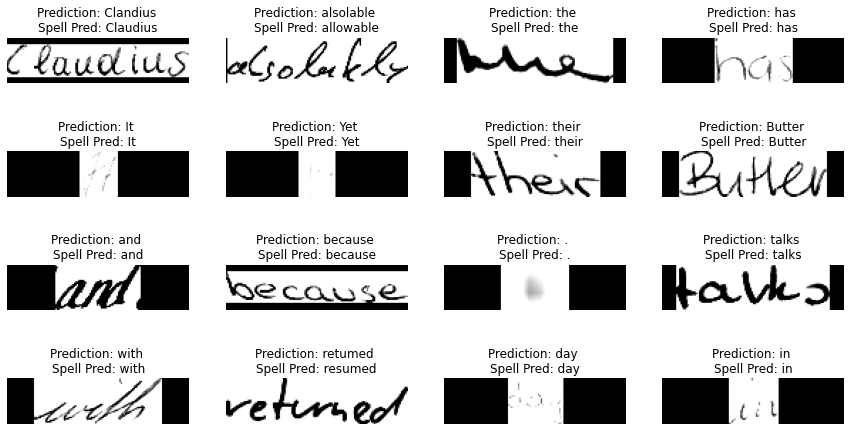

In [100]:

for batch in test_ds.take(1):
    batch_images = batch["image"]

    _, ax = plt.subplots(4, 4, figsize=(15, 8))

#     preds_e3 = prediction_model_e3.predict(batch_images)
#     pred_texts_e3 = decode_batch_predictions(preds_e3)
    
    for i in range(16):
        img = batch_images[i+15]
        img = tf.image.flip_left_right(img)
        img = tf.transpose(img, perm=[1, 0, 2])
        img = (img * 255.0).numpy().clip(0, 255).astype(np.uint8)
        img = img[:, :, 0]
        spell_pred = spell(pred_texts_e3[i+15])

        title = f"Prediction: {pred_texts_e3[i+15]} \nSpell Pred: {spell_pred}"
        ax[i // 4, i % 4].imshow(img, cmap="gray")
        ax[i // 4, i % 4].set_title(title)
        ax[i // 4, i % 4].axis("off")

plt.show()

## Model Results Summary

| Train Letter Accuracy | Val Letter Accuracy | Test Letter Accuracy | Train Word Accuracy | Val Word Accuracy |  Test Letter Accuracy | Kernel Size   |   Optimizer   |   Drop Out  |   RNN/LSTM  |  NLP Spell Check |  Epochs |
| :---------------: | :-----------------: | :-----------: | :--------------------------: | :--------------------------: | :--------------------------: | :---------------------------: | :--------------------------: | :--------------------------: | :------------------------: | :-------------------------: |  :-------------------------: |
|      0.356      |        0.351       |    0.341     |             0.213              |            0.206              |            0.196             |             3,3             |             Adam             |                0.2           |                           |                          |    15                      |
|      0.234       |       0.233       |    0.227     |            0.130 |            0.125              |       0.124              |<font color="red">2,2</font> |             Adam             |  0.2                   |                           |                          |15
|      0.332       |        0.325        |    0.322     |             0.197              | 0.192 |             0.187              |             3,3             | <font color="red">SGD</font>  |             0.2              |                          |                        |15
|    0.875        |   0.850          | 0.842        |   0.724       | 0.676        |  0.667        |             3,3            |             Adam             | 0.2 |    <font color="red">[128,64]</font>       |                |15
|      0.888       |       0.844        |    0.843    |             0.756              |             0.684             |             0.685              | <font color="red">2,2</font> |             Adam             |             0.2              | <font color="red">[200,128,64]</font>  |                    |15
|      0.903      |        0.860        |    0.864     |             0.778              |             0.697              | 0.701 |             3,3             |             Adam             |    0.2    |<font color="red">[200,128,64]</font>   |                          |15
|      0.919       |       0.872       |    0.866    |             0.813              |             0.718              |    0.711 |<font color="red">2,2</font> | Adam |  <font color="red">0.25</font> | <font color="red">[200,128,64]</font> |                    |<font color="red">35</font> 
|      0.937       |       0.886        |     0.885      |     0.852           |    0.746           |    0.751             |        3,3        |       Adam         |        0.25       | <font color="red">[200,128,64]</font>|                     |<font color="red">35</font> 
|      0.937       |       0.886        |     0.890      |     0.852           |    0.746           |    0.813             |        3,3        |       Adam         |        0.25       | <font color="red">[200,128,64]</font>|   <font color="red">Yes</font>                  |<font color="red">35</font> 

```Note:```The last run of applying NLP Spell Check applies to the test data directly, without touching the training and validation datasets, and therefore does not change the training and validation accuracies 